# import + funcs

In [1]:
import pandas as pd
import os
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.regression.linear_model as sm
import ast
import warnings
import pickle
import json

def remove_last_folder(path: str) -> str:
    # 1. Normalize: collapse duplicate slashes, strip trailing ones
    normalized = os.path.normpath(path)
    # 2. dirname: drop the last component
    return os.path.dirname(normalized)


def SaveFig(file_name,figure_dir):
    if not os.path.isdir(figure_dir):
        os.makedirs(figure_dir)
    plt.savefig(figure_dir + file_name, bbox_inches='tight')
    plt.show()

# ignore only deprecation warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

def reactivation_per_minute(nrem_filtered_chunk_data, nrem_state_times):
    # save out data
    reactivations_found = len(nrem_filtered_chunk_data)

    if len(nrem_state_times) > 0:
        mins = sum(np.diff(nrem_state_times))[0]
    else:
        mins = 0
        
    # convert to mins            
    mins = mins/60

    if mins > 0:
        return reactivations_found/mins
    else:
        return np.nan
    
def define_spindle_linkage(spindle_start_events,spindle_end_events,replay_times):
    spindle_linkage_distance = []
    for event in replay_times:
        current_shortest_dist = 999999
        for i,spin_start in enumerate(spindle_start_events):
            s_distance = abs(spin_start - event)
            e_distance = abs(spindle_end_events[i] - event)
            if s_distance < abs(current_shortest_dist):
                current_shortest_dist = s_distance
            elif e_distance < abs(current_shortest_dist):
                current_shortest_dist = e_distance
        spindle_linkage_distance += [current_shortest_dist]
    return spindle_linkage_distance

def return_spindle_linkage_masks(file, filtered_chunk_data, spindle_events, time_spans, linkage_distance,non_linked_distance):

    chunk_number = int(file.split('_')[0][-1])
    chunk_start_offset = ([0]+list(np.cumsum(np.diff(time_spans))))[chunk_number-1]
    # make relative to start of chunk
    fs_event_times = filtered_chunk_data['first_spike_time'].values - chunk_start_offset
    # put these back in proper ephys time:
    fs_event_times = fs_event_times + time_spans[chunk_number-1][0]
    # get spindle times
    spindle_start_times = [event['start_time'] for event in spindle_events]
    spindle_end_times = [event['end_time'] for event in spindle_events]
    # spindle distances
    absolute_spindle_distances = abs(np.array(define_spindle_linkage(spindle_start_times,spindle_end_times,fs_event_times)))
    # get the linked and unlinked masks
    linked_mask = absolute_spindle_distances < 1.5
    not_linked_mask = absolute_spindle_distances > 2.5
    
    return linked_mask, not_linked_mask

def return_binned_replay_rate(file, filtered_chunk_data, time_spans, current_sleep_start):
    chunk_number = int(file.split('_')[0][-1])
    chunk_start_offset = ([0]+list(np.cumsum(np.diff(time_spans))))[chunk_number-1]
    # make relative to start of chunk
    fs_event_times = filtered_chunk_data['first_spike_time'].values - chunk_start_offset
    # put these back in proper ephys time:
    fs_event_times = fs_event_times + time_spans[chunk_number-1][0]
    # now make relative to sleep start time
    f_spike_times_relative_to_so = fs_event_times - current_sleep_start 
    # filter out anything that happened before sleep onset
    f_spike_times_relative_to_so = f_spike_times_relative_to_so[f_spike_times_relative_to_so > 0]

    ## calculate rate over time:
    time_data = pd.Series(f_spike_times_relative_to_so)
    if len(time_data) > 0:
        # Calculate the number of bins required # 20s bins
    #     num_bins = int((time_data.max() - time_data.min()) // 40 + 1)
        if time_data.max() - time_data.min() > 19:
            num_bins = int((time_data.max() - time_data.min())//20)
            # Create bins and count the occurrences in each bin
            chunk_event_rate, chunk_relative_time_bins = np.histogram(time_data, bins=num_bins)
            #remove extra final bin and convert to mins
            chunk_relative_time_bins = chunk_relative_time_bins[0:-1]/60
            
            binned_rate = [list((chunk_event_rate*3).astype(float))] # *3 because its per 20s so we want it per minute )
            bins_relative_so = [list(chunk_relative_time_bins.astype(float))]
            
            return binned_rate,bins_relative_so
        return np.nan, np.nan
    return np.nan, np.nan

def load_start_end_dfs(mouse,start_end_df,mask,current_data_path_temporal_structre,chunk_number):
    try:
        ## start stop points
        df_load = pd.read_csv(current_data_path_temporal_structre+'start_end_df.csv',index_col=0)
        
        starts = df_load[df_load.group == 'starts'].reset_index(drop=True)[mask]
        ends = df_load[df_load.group == 'ends'].reset_index(drop=True)[mask]
        df_filtered = pd.concat([starts, ends], axis=0)
        df_filtered['mouse'] = [mouse]*len(df_filtered)
        df_filtered['chunk_number'] = [chunk_number]*len(df_filtered)
        start_end_df = pd.concat((start_end_df,df_filtered),axis =0)
        start_end_df.reset_index(drop = True)
    except:
        print('no start stops points available')
    return start_end_df

def cluster_events(start_times, end_times, threshold):
    clusters = []
    for i in range(len(start_times)):
        event_added = False
        for cluster in clusters:
            for index in cluster:
                if (start_times[i] <= end_times[index] + threshold and end_times[i] >= start_times[index] - threshold):
                    cluster.append(i)
                    event_added = True
                    break
            if event_added:
                break
        if not event_added:
            clusters.append([i])
    return clusters

def relative_dict(input_dict):
    total_sum = sum(input_dict.values())
    relative_dict = {key: value / total_sum for key, value in input_dict.items()}
    return relative_dict


def determine_relative_coactivity_per_chunk(filtered_chunk_data, event_proximity_filter, coactive_freqs_chunk):

    ### ignore the origonal clusterg rosp and remake them: 
    start_times = filtered_chunk_data.first_spike_time.values
    end_times = filtered_chunk_data.last_spike_time.values

    clustered_events = cluster_events(start_times, end_times,event_proximity_filter)

    cluster_group = np.zeros(len(filtered_chunk_data))
    for index,cluster in enumerate(clustered_events):
        for item in cluster:
            cluster_group[item] = int(index)
    filtered_chunk_data_coactive = filtered_chunk_data.copy()
    filtered_chunk_data_coactive['coactive_cluster_group'] = cluster_group

    # work out how mnay coacitve in chunk: 
    current_coactive_freqs_chunk = {}
    for cluster in filtered_chunk_data_coactive.coactive_cluster_group.unique():
        num = list(filtered_chunk_data_coactive.coactive_cluster_group.values).count(cluster)
        if num in current_coactive_freqs_chunk:
            current_coactive_freqs_chunk[num] += 1
        else:
            current_coactive_freqs_chunk[num] = 1

    avs =[]
    for item in current_coactive_freqs_chunk:
        avs += current_coactive_freqs_chunk[item] * [item]
    # av_coactive_len_per_chunk += [np.mean(avs)]

    # make it relative:
    current_coactive_freqs_chunk = relative_dict(current_coactive_freqs_chunk)
    coactive_freqs_keys = list(current_coactive_freqs_chunk.keys())
    rel_coactive_freqs = list(current_coactive_freqs_chunk.values())
    for index,item in enumerate(rel_coactive_freqs):
        num = int(coactive_freqs_keys[index])
        if num in coactive_freqs_chunk:
            coactive_freqs_chunk[num] += [item]
        else:
            coactive_freqs_chunk[num] = [item]
            
    return coactive_freqs_chunk,filtered_chunk_data_coactive


def create_multicluster_dataframe(filtered_chunk_data):
    meaned_order = []
    fs_order = []
    event_times = []
    count = 0
    for i,group in enumerate(filtered_chunk_data.coactive_cluster_group.unique()):
        group_mask = filtered_chunk_data.coactive_cluster_group == group
        current_cluster = filtered_chunk_data[group_mask].copy()
        if len(current_cluster) > 1:
            means = []
            event_types = []
            fs_orders = []
            for index,events in enumerate(current_cluster.cluster_spike_times):
                event_types += [current_cluster.cluster_seq_type.values[index]]
                # calculate event order based on spike time weighted mean
                means += [np.mean(ast.literal_eval(events))]
                # calculate order based on first spike time:
                fs_orders += [current_cluster.first_spike_time.values[index]]

            # order by mean time:    
            meaned_order += [list(np.array(event_types)[np.argsort(means)])]
            # order by first spike:
            fs_order += [list(np.array(event_types)[np.argsort(fs_orders)])]

            event_times += [fs_orders]

            current_cluster['new_cluster_group'] =  [count]*len(current_cluster)
            current_cluster['cluster_order_first_spike_defined'] =  list(np.argsort(np.argsort(fs_orders)))
            current_cluster['cluster_order_mean_weighted_spikes_defined'] =  list(np.argsort(np.argsort(means)))

            if count == 0:
                multi_cluster_df = current_cluster.copy()
            else:
                # Concatenate the DataFrames vertically (row-wise)
                multi_cluster_df = pd.concat([multi_cluster_df, current_cluster], axis=0)
                # Reset the index if needed
                multi_cluster_df = multi_cluster_df.reset_index(drop=True)

            count += 1
    return multi_cluster_df,meaned_order,fs_order

def logic_machine_for_pair_catagorisation(pair,dominant,other):
    # if first one in dominant check for ordering:
    if pair[0] in dominant and pair[-1] in dominant:
        if pair_in_sequence(pair,dominant):
            return('ordered')
        elif pair_in_sequence(pair,dominant[::-1]):
            return('reverse')
        elif pair[-1] == pair[0]:
            return('repeat')
        elif pair[-1] in dominant:
            return('misordered') 
    # if its not these  options then check if it could be in the extra task seqs
    elif pair[0] in  (dominant + other) and pair[-1] in  (dominant + other):
        for item in other:
            if pair[0] in  (dominant + [item]):
                if pair_in_sequence(pair,(dominant + [item])):
                    return('ordered')
                elif pair_in_sequence(pair,(dominant + [item])[::-1]):
                    return('reverse')
                elif pair[-1] == pair[0]:
                    return('repeat')
                elif pair[-1] in (dominant + [item]):
                    return('misordered')  
        # if not this then check if both are in the extra seqs (and are not a repeat):
        if pair[0] in other and pair[-1] in other:
            if not pair[-1] == pair[0]: 
                return('ordered')
    else:
        # if item 1 is in but item 2 isnt then task to other 
        if pair[0] in  (dominant + other):
            if not pair[-1] in  (dominant + other):
                return('task to other')
        # if item 2 is in but item 1 isnt then other to task 
        elif not pair[0] in  (dominant + other):
            if pair[-1] in  (dominant + other):
                return('other to task')
            else:
                return('other')
    return print('ERROR!')

def Clusters_to_process_bool(filtered_chunk_data):
    """
    Check if there are clusters with more than one event in the filtered chunk data.
    Returns True if there are such clusters, otherwise False.
    """
    # Check if any cluster has more than one event
    for i,group in enumerate(filtered_chunk_data.coactive_cluster_group.unique()):
        group_mask = filtered_chunk_data.coactive_cluster_group == group
        current_cluster = filtered_chunk_data[group_mask].copy()
        if len(current_cluster) > 1:
            return True
    return False

def pair_in_sequence(pair, sequence):
    for i in range(len(sequence) - 1):
        if sequence[i] == pair[0] and sequence[i + 1] == pair[1]:
            return True
        # because its ciruclar:
        elif sequence[-1] == pair[0] and sequence[0] == pair[1]:
            return True
    return False

def calculate_ordering_amounts(meaned_order,dominant,other_):
    ordered = 0
    misordered = 0
    other = 0
    for cluster in meaned_order:
        for ind,item in enumerate(cluster):
            if not ind == len(cluster)-1:
                pair = [item,cluster[ind+1]]
                outcome = logic_machine_for_pair_catagorisation(pair,dominant,other_)
                if outcome in ['ordered', 'repeat', 'reverse']:
                    ordered += 1
                elif outcome == 'misordered':
                    misordered += 1
                else:
                    other +=1
    return ordered,misordered,other

def calculate_ordering_proportions(filtered_chunk_data,mouse_file, sequence_order_df):

    # make multi cluster df
    if Clusters_to_process_bool(filtered_chunk_data):
        multi_cluster_df,meaned_order,fs_order = create_multicluster_dataframe(filtered_chunk_data)
    else:
        multi_cluster_df,meaned_order,fs_order = [],[],[]

    # pull out sequence order for current mouse
    seq_order= ast.literal_eval(sequence_order_df[sequence_order_df.mir == mouse_file].seq_order.values[0])
    # num_dominant_seqs = int(sequence_order_df[sequence_order_df.mir == mouse_file].dominant_task_seqs)
    num_dominant_seqs = int(sequence_order_df.loc[sequence_order_df.mir == mouse_file, "dominant_task_seqs"].iat[0])
    
    
    real_order = np.array(seq_order)+1

    #deal wih the fact that the way I order the sequence messes up the order a bit
    if not len(real_order) == num_dominant_seqs:
        dominant = list(real_order[0:num_dominant_seqs])
        other_ = list(real_order[num_dominant_seqs::])
    else:
        dominant = list(real_order)
        other_ = []
        
    # orderng amounts for mean ordering - this calculated for each pair in the chunk 
    ordered,misordered,other = calculate_ordering_amounts(meaned_order,dominant,other_)

    # i only care abot ordered and misordered here, so lets just take these out:
    if ordered+misordered > 0:
        # ordered_misordered_proportions = [ordered/(ordered+misordered),misordered/(ordered+misordered)]
        return ordered,misordered
    else:
        return [0,0]
    
def determine_task_related_events(sequential_data, sequence_order_df,mouse_file,real_order):

    task_related = 0
    non_task_related = 0
    for motif_type in sequential_data.cluster_seq_type:
        if motif_type in real_order:
            task_related += 1
        else:
            non_task_related += 1

    
    return [non_task_related, task_related]
    
def get_normalised_task_related_proportions(nrem_nontask_task_chunk,real_order):
    #flatten list
    if sum([item for sublist in nrem_nontask_task_chunk for item in sublist]) == 0:
        return [np.nan,np.nan]
    else:
        # normalise by number of each type: 
        task_related_normalised_total = sum([item[1] for item in nrem_nontask_task_chunk])/len(real_order)
        if (6-len(real_order)) == 0:
            non_task_related_normalised_total = sum([item[0] for item in nrem_nontask_task_chunk])
        else:
            non_task_related_normalised_total = sum([item[0] for item in nrem_nontask_task_chunk])/(6-len(real_order))
        normalised_total = task_related_normalised_total + non_task_related_normalised_total
        return [task_related_normalised_total/normalised_total,non_task_related_normalised_total/normalised_total]
    

def extract_sequence_events(df, sequence_type, groups, bin_size, seq_size_threshold):
    """
    Extracts spike events from continuous groups of time bins for a specific sequence type.
    """
    extracted = []

    for start, end in groups:
        group_start_time = (start * bin_size) - 0.5
        group_end_time = (end * bin_size) + 0.5

        time_mask = (df.timestamp > group_start_time) & (df.timestamp < group_end_time)
        group_spikes = df[time_mask]
        matching_seq = group_spikes[group_spikes.sequence_type_adjusted == sequence_type]

        if len(matching_seq) > seq_size_threshold:
            extracted.append(matching_seq)

    return extracted


def plot_sequence_summary(ax1,ax2,unmasked_spikes_df, awake_neuron_order, colors, seq_spike_count, groups, i, time_window, bin_size):
    """
    Plots spike raster and sequence histogram for a given sequence type.
    """
    # Filter spikes within the plotting window
    mask = (unmasked_spikes_df.timestamp > time_window[0]) & (unmasked_spikes_df.timestamp < time_window[1])
    visible_spikes = unmasked_spikes_df[mask]
    valid_seq_mask = visible_spikes.sequence_type_adjusted >= 0
    spike_colors = np.array(colors)[visible_spikes[valid_seq_mask].sequence_type_adjusted.values.astype(int)]

    # Spike raster
    ax1.scatter(
        visible_spikes[valid_seq_mask].timestamp,
        awake_neuron_order[mask][valid_seq_mask],
        marker='o', s=40, linewidth=0, color=spike_colors, alpha=1
    )

    # Histogram and detected groups
    ax2.plot(seq_spike_count, color=colors[i])
    for start, end in groups:
        ax2.plot([start, end], [-5, -5], color='red')

    ax1.set_xlim([time_window[0], time_window[-1]])
    ax2.set_xlim(time_window[0]/bin_size,time_window[-1] / bin_size)


def return_inds_for_seq_groups(lst):
    groups = []
    new = True
    for ind,item in enumerate(lst):
        if new:
            if item > 0:
                start = ind
                new = False
        else:
            if item == 0:
                end = ind-1
                groups.append((start, end))
                new = True
    return groups

def process_awake_data_return_seq_dfs(unmasked_spikes_df, chunk_time, awake_neuron_order, colors, plotting_limit,bin_size=0.2, seq_size_threshold=5):
    """
    Processes spike data to extract time-localized spike events for each sequence type (1–6).
    """
    seq_types = np.unique(unmasked_spikes_df.sequence_type_adjusted)

    # Gather spike timestamps by sequence type
    seq_spikes = [unmasked_spikes_df.timestamp[unmasked_spikes_df.sequence_type_adjusted == seq_type].values for seq_type in seq_types]

    # Compute binned spike histograms
    seq_spike_occurrence = [list(np.histogram(spikes, bins=np.arange(0, np.diff(chunk_time)[0], bin_size))[0]) for spikes in seq_spikes]

    seq_event_dfs = []
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 5))
    for i in range(1, 7):  # process sequence types 1–6
        print(f"Processing sequence type: {i}")
        seq_spike_count = seq_spike_occurrence[i]
        groups = return_inds_for_seq_groups(seq_spike_count)

        # Plot sequence summary (raster + histogram)
        plot_sequence_summary(ax1,ax2,unmasked_spikes_df, awake_neuron_order, colors, seq_spike_count, groups, i, plotting_limit,bin_size)

        # Extract sequence events as separate DataFrames
        seq_event_dfs.extend(
            extract_sequence_events(unmasked_spikes_df, i, groups, bin_size, seq_size_threshold)
        )

    return seq_event_dfs

def determine_awake_neuron_motif_involvements(unmasked_spikes_df, seq_event_dfs):

    seq_by_seq_awake_mean_neuron_motif_involvements = []
    ### determine which neurons are involved in awake seqs
    all_neurons_list = list(np.unique(unmasked_spikes_df.neuron))
    for seq_type in range(1,7):
        # print(seq_type)
        # Determine mean neuron involvements for awake
        neuron_motif_involvements = [[] for _ in range(len(all_neurons_list))]
        for awake_seq in seq_event_dfs:
            if awake_seq.sequence_type_adjusted.values[0] == seq_type:
                for id_, neuron_id in enumerate(all_neurons_list):
                    if neuron_id in awake_seq.neuron.values:
                        neuron_motif_involvements[id_].append(1)
                    else:
                        neuron_motif_involvements[id_].append(0)
        #find mean involvements:
        awake_mean_neuron_motif_involvements = []
        for item in neuron_motif_involvements:
            if len(item)>0:
                awake_mean_neuron_motif_involvements += [sum(item)/len(item)]
            else:
                awake_mean_neuron_motif_involvements += [0]
        seq_by_seq_awake_mean_neuron_motif_involvements += [awake_mean_neuron_motif_involvements]
    return seq_by_seq_awake_mean_neuron_motif_involvements

def find_awake_file_ppseq_path(mouse,ppseq_path):
    if any([mouse in file for file in os.listdir(ppseq_path + r'expert/awake//')]) == True:
        file_ind = np.where(np.array([mouse in file for file in os.listdir(ppseq_path + r'expert/awake//')]) == True)[0][0]
        awake_file_path = os.path.join(ppseq_path, r'expert/awake', os.listdir(ppseq_path + r'expert/awake//')[file_ind])
    elif any([mouse in file for file in os.listdir(ppseq_path + r'learning/awake//')]) == True:    
        file_ind = np.where(np.array([mouse in file for file in os.listdir(ppseq_path + r'learning/awake//')]) == True)[0][0]
        awake_file_path = os.path.join(ppseq_path, r'learning/awake', os.listdir(ppseq_path + r'learning/awake//')[file_ind])
    else:
        print('awake file not found for mouse: ' + mouse)
    return awake_file_path

def determine_sleep_neuron_motif_involvements(filtered_chunk_data,unmasked_spikes_df):

    per_seq_sleep_involvement = []
    for seq in range(1,7):
        current_seq_events = filtered_chunk_data[filtered_chunk_data.cluster_seq_type == seq]
        if len(current_seq_events) > 0:
            # loop across neurons
            per_neuron_sleep_involvement = []
            for neuron in unmasked_spikes_df.neuron.unique():
                involvement = []
                for event in current_seq_events.cluster_neurons.values:
                    event = ast.literal_eval(event)
                    if neuron in event:
                        involvement += [1]
                    else:
                        involvement += [0]
                per_neuron_sleep_involvement += [sum(involvement)/len(involvement)]
            per_seq_sleep_involvement += [per_neuron_sleep_involvement]
        else:
            per_seq_sleep_involvement += [[np.nan]*len(unmasked_spikes_df.neuron.unique())]
    return per_seq_sleep_involvement
                
def load_in_sleep_state_scoring(mouse):
    print('---------------------')
    print('searching for sleep state scoring')
    # determine organised data paths for the current mouse
    if mouse.split('_')[0].isdigit():
        org_dat_path = r"Z:\projects\sequence_squad\organised_data\animals\\"
        old_data = True
    else:
        org_dat_path = r"Z:\projects\sequence_squad\revision_data\organised_data\animals\\"
        old_data = False
    org_mouse_file = None
    for file in os.listdir(org_dat_path):
        if mouse.split('_')[0] in file:
            # if the implant = implant
            if mouse.split('_')[1] == file.split('_')[-1][-1]:
                print(f'1. mouse file found: \033[1m{file}\033[0m')
                org_mouse_file = os.path.join(org_dat_path,file)
    mouse_org_data_path = None
    for recording in os.listdir(org_mouse_file):
        if mouse.split('_')[-1] == recording.split('ing')[-1].split('_')[0]:
            print(f'2. recording found: \033[1m{recording}\033[0m')
            mouse_org_data_path = os.path.join(org_mouse_file,recording) + r'\\'

    # load in sleep scoring data 

    sleep_state_score_path = mouse_org_data_path + r"\ephys\LFP\\sleep_state_score\\"
    if not os.path.exists(sleep_state_score_path):
        sleep_state_score_path =  mouse_org_data_path + '/ephys/probeA/LFP/'

    if not os.path.exists(sleep_state_score_path):
        print(f"Sleep state score files not found for {mouse}.")
    else:
        nrem_start_ends = np.load(sleep_state_score_path + "nrem_start_ends.npy", allow_pickle=True)
        rem_start_ends = np.load(sleep_state_score_path + "rem_start_ends.npy", allow_pickle=True)
        print (f"\033[1mSuccess!\033[0m Loaded sleep state score files for mouse: {mouse}.")

    print('----------------------')
        
    return nrem_start_ends,rem_start_ends,mouse_org_data_path,old_data

def get_chunk_state_times(rem_start_ends,chunk_time):
    chunk_rem_times = []
    for start,end in rem_start_ends:
        if start >= chunk_time[0] and start <= chunk_time[1]:
            start_chunk_rebased = start - chunk_time[0]
            end_chunk_rebased = end - chunk_time[0]
            # expand by 10%
            start_chunk_rebased = start_chunk_rebased * 0.9
            end_chunk_rebased = end_chunk_rebased * 1.1
            # if the end stetches past the end of the chunk then just set it to the end of the chunk
            if end_chunk_rebased > np.diff(chunk_time)[0]:
                end_chunk_rebased = np.diff(chunk_time)[0]
            chunk_rem_times += [[start_chunk_rebased,end_chunk_rebased]]
    return chunk_rem_times

def calculate_ordered_proportion(nrem_chunk_ordered_misordered_proportions):
    ordered = [sublist[0] for sublist in nrem_chunk_ordered_misordered_proportions]
    misordered = [sublist[-1] for sublist in nrem_chunk_ordered_misordered_proportions]
    if sum(misordered) + sum(ordered) > 0:
        return [sum(ordered)/ (sum(misordered) + sum(ordered)),sum(misordered)/ (sum(misordered) + sum(ordered))]
    else:
        return [np.nan,np.nan]

# Preprocessing - dont need to run this again, you can skip to loading the data 2 cells below! 

----------
136_1_3
0
136_1_3
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\136_1_3_run_1007023_2048\_final_analysis_output
chunk1_8700to9300
---------------------
searching for sleep state scoring
1. mouse file found: EJT136_implant1
2. recording found: recording3_11-11-2021
Success! Loaded sleep state score files for mouse: 136_1_3.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_10000to11600
---------------------
searching for sleep state scoring
1. mouse file found: EJT136_implant1
2. recording found: recording3_11-11-2021
Success! Loaded sleep state score files for mouse: 136_1_3.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_11900to12500
---------------------
searching for sleep state scoring
1. mouse file found: EJT136_implant1
2. recording found: recording3_11-11-2021
Success! Loaded sleep state score files for mouse: 136_1_3.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:178: RuntimeWarning: Mean of empty slice
  nrem_chunk_event_lens += [np.nanmean(list(nrem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
136_1_4
1
136_1_4
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\136_1_4_run_0707023_0452\_final_analysis_output
chunk1_7600to8200
---------------------
searching for sleep state scoring
1. mouse file found: EJT136_implant1
2. recording found: recording4_12-11-2021
Success! Loaded sleep state score files for mouse: 136_1_4.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:178: RuntimeWarning: Mean of empty slice
  nrem_chunk_event_lens += [np.nanmean(list(nrem_filtered_chunk_data.event_length.values))]
C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_8800to9400
---------------------
searching for sleep state scoring
1. mouse file found: EJT136_implant1
2. recording found: recording4_12-11-2021
Success! Loaded sleep state score files for mouse: 136_1_4.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_9950to10550
---------------------
searching for sleep state scoring
1. mouse file found: EJT136_implant1
2. recording found: recording4_12-11-2021
Success! Loaded sleep state score files for mouse: 136_1_4.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
148_2_2
2
148_2_2
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\148_2_2_run_1007023_1840\_final_analysis_output
chunk1_3000to4000
---------------------
searching for sleep state scoring
1. mouse file found: EJT148_implant2
2. recording found: recording2_19-10-2020
Success! Loaded sleep state score files for mouse: 148_2_2.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_4000to5000
---------------------
searching for sleep state scoring
1. mouse file found: EJT148_implant2
2. recording found: recording2_19-10-2020
Success! Loaded sleep state score files for mouse: 148_2_2.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_5000to6000
---------------------
searching for sleep state scoring
1. mouse file found: EJT148_implant2
2. recording found: recording2_19-10-2020
Success! Loaded sleep state score files for mouse: 148_2_2.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:178: RuntimeWarning: Mean of empty slice
  nrem_chunk_event_lens += [np.nanmean(list(nrem_filtered_chunk_data.event_length.values))]
C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
149_1_1
3
149_1_1
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\149_1_1_run_0107023_1535\_final_analysis_output
chunk1_8300to9300
---------------------
searching for sleep state scoring
1. mouse file found: EJT149_implant1
2. recording found: recording1_16-11-2021
Success! Loaded sleep state score files for mouse: 149_1_1.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_9600to10600
---------------------
searching for sleep state scoring
1. mouse file found: EJT149_implant1
2. recording found: recording1_16-11-2021
Success! Loaded sleep state score files for mouse: 149_1_1.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_12600to13600
---------------------
searching for sleep state scoring
1. mouse file found: EJT149_implant1
2. recording found: recording1_16-11-2021
Success! Loaded sleep state score files for mouse: 149_1_1.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
178_1_4
4
178_1_4
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\178_1_4_run_0807023_1648\_final_analysis_output
chunk1_7500to8100
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording4_18-03-2022
Success! Loaded sleep state score files for mouse: 178_1_4.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_8500to9100
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording4_18-03-2022
Success! Loaded sleep state score files for mouse: 178_1_4.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_9500to10100
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording4_18-03-2022
Success! Loaded sleep state score files for mouse: 178_1_4.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
178_1_5
5
178_1_5
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\178_1_5_run_0507023_2349\_final_analysis_output
chunk1_8000to8600
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording5_21-03-2022
Success! Loaded sleep state score files for mouse: 178_1_5.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:178: RuntimeWarning: Mean of empty slice
  nrem_chunk_event_lens += [np.nanmean(list(nrem_filtered_chunk_data.event_length.values))]
C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_9000to9600
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording5_21-03-2022
Success! Loaded sleep state score files for mouse: 178_1_5.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:178: RuntimeWarning: Mean of empty slice
  nrem_chunk_event_lens += [np.nanmean(list(nrem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_12200to12800
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording5_21-03-2022
Success! Loaded sleep state score files for mouse: 178_1_5.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
178_1_6
6
178_1_6
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\178_1_6_run_0607023_1548\_final_analysis_output
chunk1_8600to9300
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording6_29-03-2022
Success! Loaded sleep state score files for mouse: 178_1_6.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_10000to10600
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording6_29-03-2022
Success! Loaded sleep state score files for mouse: 178_1_6.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_12000to12600
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording6_29-03-2022
Success! Loaded sleep state score files for mouse: 178_1_6.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2704531963.py:446: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 5))


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
178_1_7
7
178_1_7
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\178_1_7_run_1207023_1350\_final_analysis_output
chunk1_8300to10000
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording7_30-03-2022
Success! Loaded sleep state score files for mouse: 178_1_7.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_10500to11200
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording7_30-03-2022
Success! Loaded sleep state score files for mouse: 178_1_7.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_13300to14300
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording7_30-03-2022
Success! Loaded sleep state score files for mouse: 178_1_7.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
178_1_8
8
178_1_8
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\178_1_8_run_0507023_1028\_final_analysis_output
chunk1_11300to12000
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording8_31-03-2022
Success! Loaded sleep state score files for mouse: 178_1_8.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_13200to13800
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording8_31-03-2022
Success! Loaded sleep state score files for mouse: 178_1_8.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:178: RuntimeWarning: Mean of empty slice
  nrem_chunk_event_lens += [np.nanmean(list(nrem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_16400to17000
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording8_31-03-2022
Success! Loaded sleep state score files for mouse: 178_1_8.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
178_1_9
9
178_1_9
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\178_1_9_run_0607023_0042\_final_analysis_output
chunk1_9000to9900
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording9_01-04-2022
Success! Loaded sleep state score files for mouse: 178_1_9.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_10100to10700
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording9_01-04-2022
Success! Loaded sleep state score files for mouse: 178_1_9.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_11300to11900
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant1
2. recording found: recording9_01-04-2022
Success! Loaded sleep state score files for mouse: 178_1_9.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
178_2_1
1

C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_9900to10500
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant2
2. recording found: recording1_04-04-2022
Success! Loaded sleep state score files for mouse: 178_2_1.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_14000to14600
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant2
2. recording found: recording1_04-04-2022
Success! Loaded sleep state score files for mouse: 178_2_1.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
178_2_2
11
178_2_2
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\178_2_2_run_0607023_0956\_final_analysis_output
chunk1_12300to12900
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant2
2. recording found: recording2_05-04-2022
Success! Loaded sleep state score files for mouse: 178_2_2.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_13600to14200
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant2
2. recording found: recording2_05-04-2022
Success! Loaded sleep state score files for mouse: 178_2_2.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_15400to16000
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant2
2. recording found: recording2_05-04-2022
Success! Loaded sleep state score files for mouse: 178_2_2.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
178_2_4
12
178_2_4
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\178_2_4_run_0407023_2337\_final_analysis_output
chunk1_9700to10500
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant2
2. recording found: recording4_07-04-2022
Success! Loaded sleep state score files for mouse: 178_2_4.
----------------------
Processin

C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk4_15600to16000
---------------------
searching for sleep state scoring
1. mouse file found: EJT178_implant2
2. recording found: recording4_07-04-2022
Success! Loaded sleep state score files for mouse: 178_2_4.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:178: RuntimeWarning: Mean of empty slice
  nrem_chunk_event_lens += [np.nanmean(list(nrem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
269_1_1
13
269_1_1
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\269_1_1_run_3006023_0438\_final_analysis_output
chunk1_7900to8900
---------------------
searching for sleep state scoring
1. mouse file found: EJT269_implant1
2. recording found: recording1_13-05-2023
Success! Loaded sleep state score files for mouse: 269_1_1.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_10000to11000
---------------------
searching for sleep state scoring
1. mouse file found: EJT269_implant1
2. recording found: recording1_13-05-2023
Success! Loaded sleep state score files for mouse: 269_1_1.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_13000to14000
---------------------
searching for sleep state scoring
1. mouse file found: EJT269_implant1
2. recording found: recording1_13-05-2023
Success! Loaded sleep state score files for mouse: 269_1_1.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
269_1_3
1

C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_11500to12500
---------------------
searching for sleep state scoring
1. mouse file found: EJT269_implant1
2. recording found: recording3_16-05-2023
Success! Loaded sleep state score files for mouse: 269_1_3.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:178: RuntimeWarning: Mean of empty slice
  nrem_chunk_event_lens += [np.nanmean(list(nrem_filtered_chunk_data.event_length.values))]
C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:181: RuntimeWarning: Mean of empty slice
  linked_chunk_event_lens = [np.nanmean(list(linked_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
269_1_4
15
269_1_4
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\269_1_4_run_2006023_1200\_final_analysis_output
chunk1_8000to9000
---------------------
searching for sleep state scoring
1. mouse file found: EJT269_implant1
2. recording found: recording4_18-05-2023
Success! Loaded sleep state score files for mouse: 269_1_4.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_10500to11500
---------------------
searching for sleep state scoring
1. mouse file found: EJT269_implant1
2. recording found: recording4_18-05-2023
Success! Loaded sleep state score files for mouse: 269_1_4.
----------------------
Processing

C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_12000to13000
---------------------
searching for sleep state scoring
1. mouse file found: EJT269_implant1
2. recording found: recording7_23-05-2023
Success! Loaded sleep state score files for mouse: 269_1_7.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_16000to17000
---------------------
searching for sleep state scoring
1. mouse file found: EJT269_implant1
2. recording found: recording7_23-05-2023
Success! Loaded sleep state score files for mouse: 269_1_7.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
270_1_3
1

C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_12000to13000
---------------------
searching for sleep state scoring
1. mouse file found: EJT270_implant1
2. recording found: recording3_14-05-2023
Success! Loaded sleep state score files for mouse: 270_1_3.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
270_1_5
18
270_1_5
replay data path found: Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\270_1_5_run_2006023_0041\_final_analysis_output
chunk1_8300to9300
---------------------
searching for sleep state scoring
1. mouse file found: EJT270_implant1
2. recording found: recording5_17-05-2023
Success! Loaded sleep state score files for mouse: 270_1_5.
----------------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_9300to10300
---------------------
searching for sleep state scoring
1. mouse file found: EJT270_implant1
2. recording found: recording5_17-05-2023
Success! Loaded sleep state score files for mouse: 270_1_5.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_11800to12800
---------------------
searching for sleep state scoring
1. mouse file found: EJT270_implant1
2. recording found: recording5_17-05-2023
Success! Loaded sleep state score files for mouse: 270_1_5.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
270_1_6
19

C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_56640\2309075178.py:179: RuntimeWarning: Mean of empty slice
  rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]


Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk2_11000to12000
---------------------
searching for sleep state scoring
1. mouse file found: EJT270_implant1
2. recording found: recording6_19-05-2023
Success! Loaded sleep state score files for mouse: 270_1_6.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
chunk3_16000to17000
---------------------
searching for sleep state scoring
1. mouse file found: EJT270_implant1
2. recording found: recording6_19-05-2023
Success! Loaded sleep state score files for mouse: 270_1_6.
----------------------
Processing sequence type: 1
Processing sequence type: 2
Processing sequence type: 3
Processing sequence type: 4
Processing sequence type: 5
Processing sequence type: 6
----------
seq006_1_

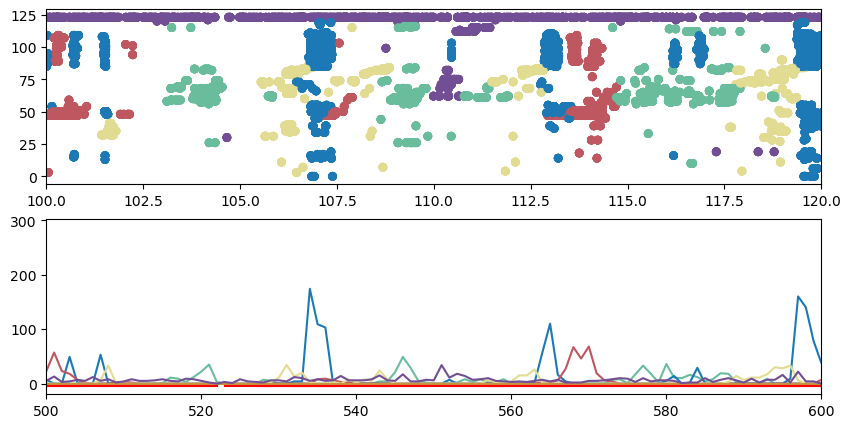

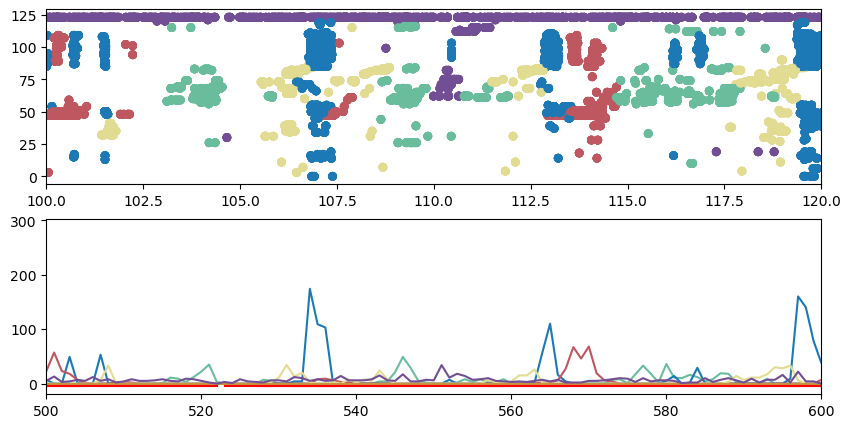

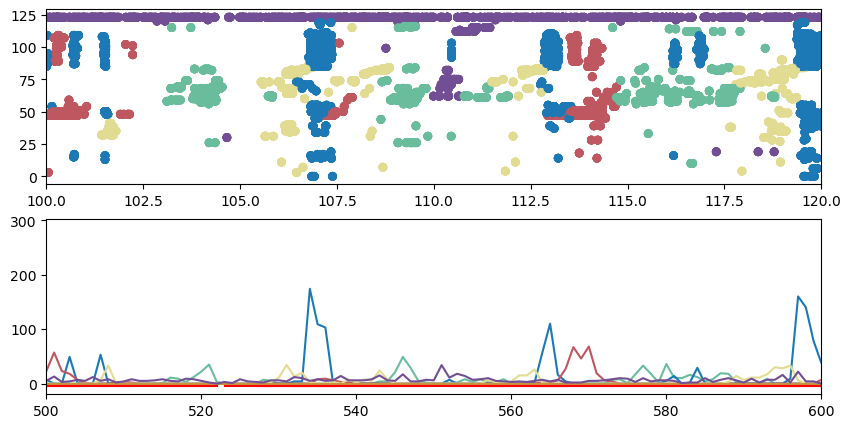

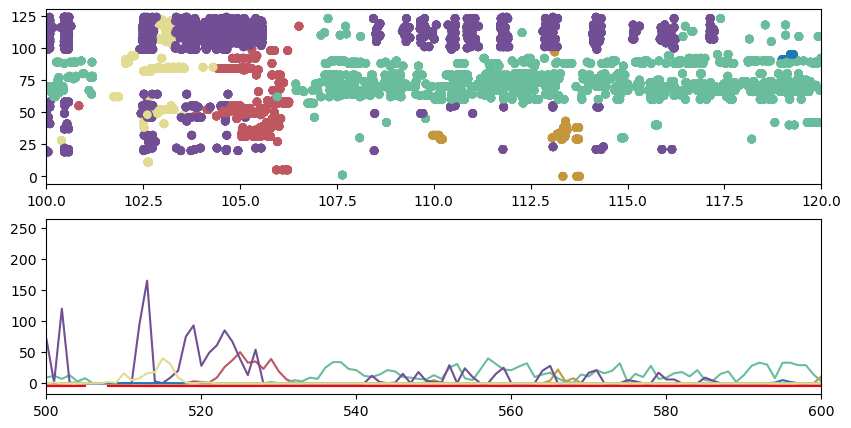

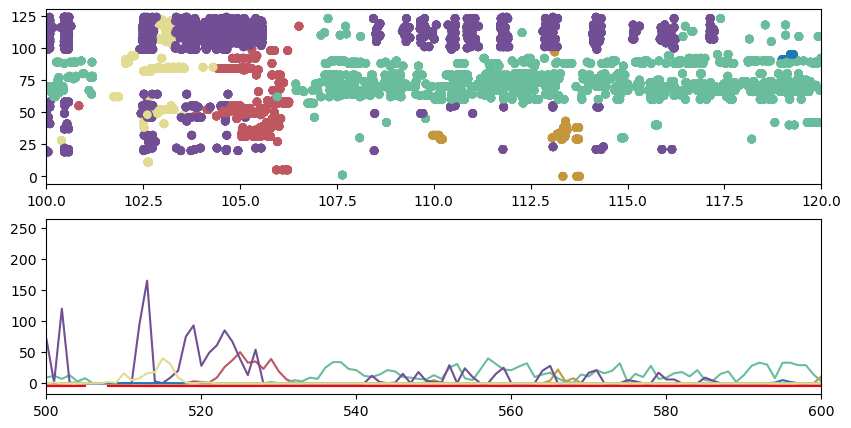

...

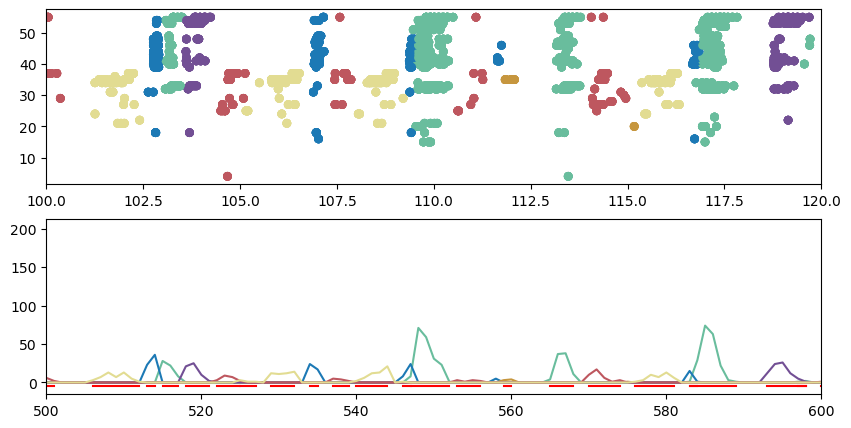

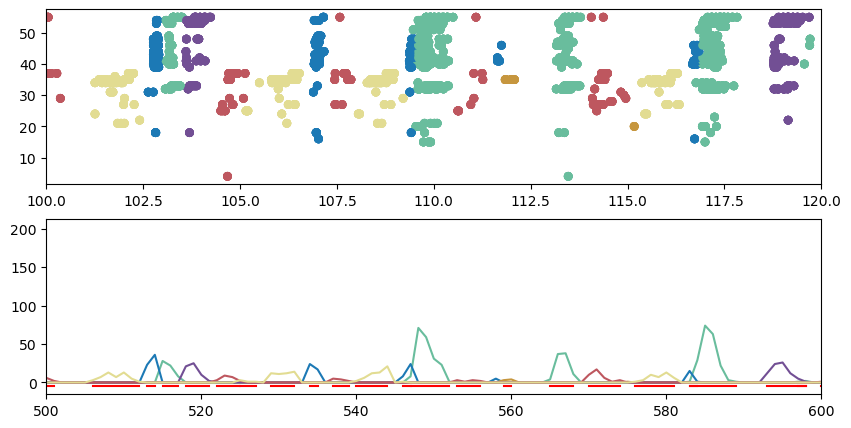

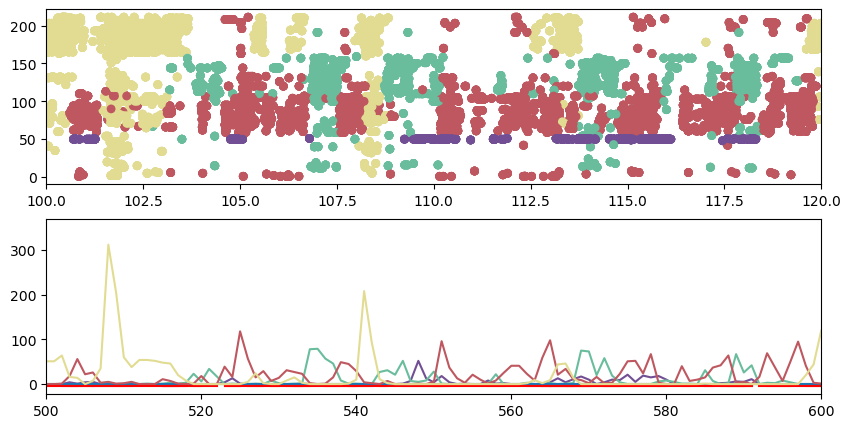

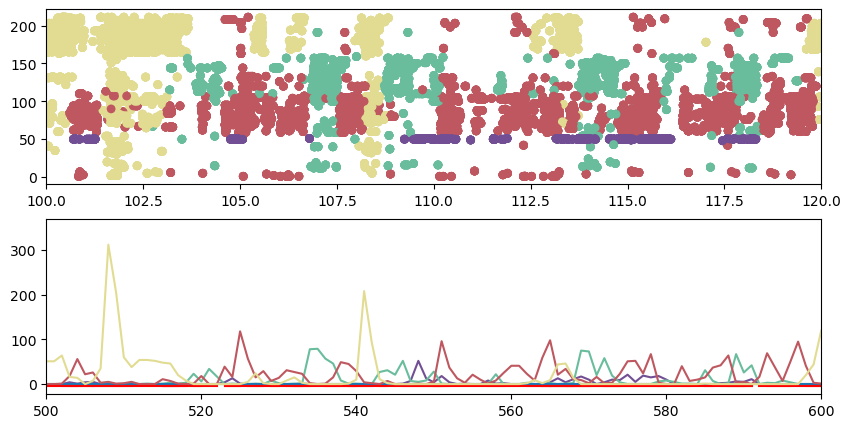

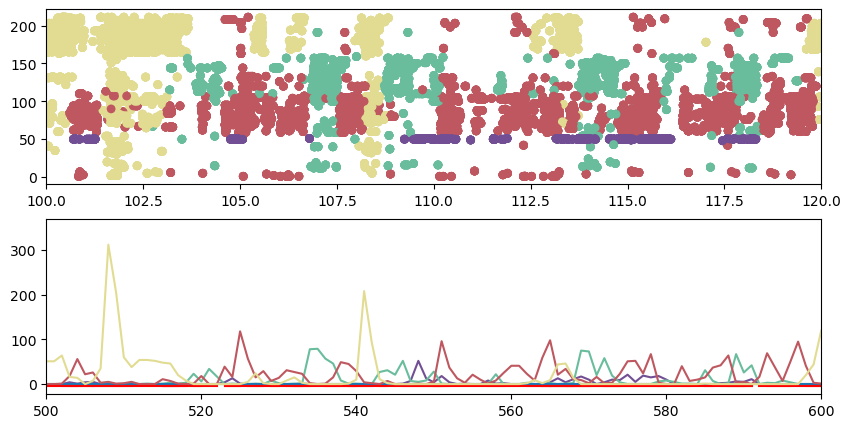

In [13]:
# # dat path:
# dat_path = r"Z:\projects\sequence_squad\organised_data\ppseq_data\output_data\striatum\New_Post_sleep\\"
# dat_path = r"Z:\projects\sequence_squad\organised_data\ppseq_data\finalised_output\striatum\paper_submission\post_sleep\\"
dat_path = r"Z:\projects\sequence_squad\ppseq_finalised_publication_data\expert\postsleep\\"

# spindle linkage path
LFP_datapath = r"Z:\projects\sequence_squad\revision_data\emmett_revisions\oscillations\striatum_lfp\expert\\"

# load in sleep time points
sleep_time_point_df = pd.read_csv(dat_path + 'sleep_time_points.csv')
# decide when sleep started
sleep_start = {}
for index,value in enumerate(sleep_time_point_df.approx_sleep_start.values):
    mouse = sleep_time_point_df.mir.values[index]
    sleep_start[mouse] = value

# initialize lists to hold data across animals
animals = []
#rpm
nrem_reactivations_per_min, rem_reactivations_per_min = [],[]
#event lengths
nrem_event_lens,rem_event_lens,linked_event_lens,unlinked_event_lens = [],[],[],[]
# regression df
nrem_regression_df= pd.DataFrame({'seq_type':[],'regression_line':[],'filt_rel_spike_times':[],'slope':[],'reactivation_ID':[],'warp_factor':[],'mouse':[]})
rem_regression_df= pd.DataFrame({'seq_type':[],'regression_line':[],'filt_rel_spike_times':[],'slope':[],'reactivation_ID':[],'warp_factor':[],'mouse':[]})
linked_regression_df= pd.DataFrame({'seq_type':[],'regression_line':[],'filt_rel_spike_times':[],'slope':[],'reactivation_ID':[],'warp_factor':[],'mouse':[]})
unlinked_regression_df= pd.DataFrame({'seq_type':[],'regression_line':[],'filt_rel_spike_times':[],'slope':[],'reactivation_ID':[],'warp_factor':[],'mouse':[]})
# decay variables 
nrem_binned_rate ,nrem_bins_relative_so = [],[]
rem_binned_rate,rem_bins_relative_so = [],[]
linked_binned_rate,linked_bins_relative_so = [],[]
unlinked_binned_rate,unlinked_bins_relative_so = [],[]
# start end points
nrem_start_end_df = pd.DataFrame({})
rem_start_end_df = pd.DataFrame({})
linked_start_end_df = pd.DataFrame({})
unlinked_start_end_df = pd.DataFrame({})
# coactive 
nrem_coactive_freqs = {}
rem_coactive_freqs = {}
linked_coactive_freqs = {}
unlinked_coactive_freqs = {}
# ordered vs misordered
nrem_ordered_misordered = []
rem_ordered_misordered = []
linked_ordered_misordered = []
unlinked_ordered_misordered = []
# task related events
nrem_task_nontask = []
rem_task_nontask = []
linked_task_nontask =[]
unlinked_task_nontask = []
# neuron involvement 
awake_seqbyseq_neuron_involvements= [[]]*6
nrem_sleep_seqbyseq_neuron_involvements= [[]]*6
rem_sleep_seqbyseq_neuron_involvements= [[]]*6
linked_sleep_seqbyseq_neuron_involvements= [[]]*6
unlinked_sleep_seqbyseq_neuron_involvements = [[]]*6



for index, mouse_file in enumerate(os.listdir(LFP_datapath)):
    replay_data_found = False
    print('----------')
    print(mouse_file)
    print(index)
    current_mouse_p = os.path.join(LFP_datapath, mouse_file)
    if 'analysis' in os.listdir(current_mouse_p):
        current_mouse_path_spindle_data = os.path.join(current_mouse_p, r"analysis\\")
        
        # load in spindle times
        spindle_events = np.load(current_mouse_path_spindle_data + 'spindle_events.npy',allow_pickle=True)
        
        # load in replay data 
        for run_index,pp_file in enumerate(os.listdir(dat_path)):
            if mouse_file in pp_file:
                print(mouse_file)
                # set path to processed files 
                current_mouse_path = dat_path + pp_file + '\\_final_analysis_output'
                print('replay data path found: ' + current_mouse_path)
                replay_data_found = True
                
                # load in sleep start time 
                current_sleep_start = sleep_start[mouse_file]
                params_file = dat_path + pp_file + r'\trainingData\\' + 'params_' + mouse_file + '.json'
                with open(params_file, 'r') as file:
                    params = json.load(file)
                time_spans = params['time_span']
                            
                break
          
      
    if not replay_data_found:
        print('No replay data found for ' + mouse_file)
        continue
    
    animals += [mouse_file]

    # initialize lists to hold data
    nrem_chunk_rpm,rem_chunk_rpm = [],[]
    #event lengths
    nrem_chunk_event_lens,rem_chunk_event_lens = [],[]
    linked_chunk_event_lens, unlinked_chunk_event_lens = [],[]
    # decay variables - chunk
    nrem_chunk_binned_rate,nrem_chunk_bins_relative_so = [],[]
    rem_chunk_binned_rate, rem_chunk_bins_relative_so= [],[]
    linked_chunk_binned_rate, linked_chunk_bins_relative_so= [],[]
    unlinked_chunk_binned_rate,unlinked_chunk_bins_relative_so = [],[]
    # ordering 
    nrem_chunk_ordered_misordered_proportions,rem_chunk_ordered_misordered_proportions,linked_chunk_ordered_misordered_proportions,unlinked_chunk_ordered_misordered_proportions = [],[],[],[]
    # task related 
    nrem_nontask_task_chunk,rem_nontask_task_chunk,linked_nontask_task_chunk,unlinked_nontask_task_chunk = [],[],[],[]
    # start end points
    
    # coactive frequency
    nrem_coactive_freqs_chunk  = {}
    rem_coactive_freqs_chunk  = {}
    linked_coactive_freqs_chunk  = {}
    unlinked_coactive_freqs_chunk  = {}
    
    ## loop across all chunk files ################################
    for chunk_number,file in enumerate(os.listdir(current_mouse_path)):
        if 'chunk' in file:
            print(file)
            

            current_data_path = current_mouse_path + '\\' + file + '\\'
            chunk_time = np.load(current_data_path + 'chunk_time_interval.npy')
            data = pd.read_csv(current_data_path + 'filtered_replay_clusters_df.csv')
            
            ###### FILTERING AND MASKING ##################################################################''
            ## filter this data for sequential ordering
            sequential_condition = data.ordering_classification == 'sequential'
            # filter is set up so that any true will carry forward 
            filtered_chunk_data = data[sequential_condition].reset_index()
            
            # # spin linked vs not linked
            linked_mask, not_linked_mask = return_spindle_linkage_masks(file, filtered_chunk_data, spindle_events, time_spans, 1.5,2.5)
            linked_filtered_chunk_data = filtered_chunk_data[linked_mask]
            unlinked_filtered_chunk_data = filtered_chunk_data[not_linked_mask]
            
            # # rem/nrem
            
            # nrem_filtered_chunk_data = filtered_chunk_data[filtered_chunk_data.nrem_events == 1]
            # rem_filtered_chunk_data = filtered_chunk_data[filtered_chunk_data.rem_events == 1]
            
            # load in sleep state scoring
            nrem_start_ends,rem_start_ends,mouse_org_data_path,old_data = load_in_sleep_state_scoring(mouse_file)
            # get relevant rem/nrem times for chunk
            chunk_nrem_times = get_chunk_state_times(nrem_start_ends,chunk_time)
            chunk_rem_times = get_chunk_state_times(rem_start_ends,chunk_time) 
            # get spike times relative to chunk:
            chunk_number = int(file.split('_')[0][-1])
            chunk_start_offset = ([0]+list(np.cumsum(np.diff(time_spans))))[chunk_number-1]
            # make relative to start of chunk
            fs_event_times = filtered_chunk_data['first_spike_time'].values - chunk_start_offset
            # find inds of spike times that are in nrem and rem periods:
            idx  = []
            for start,end in chunk_nrem_times:
                idx += list(np.where((fs_event_times >= start) & (fs_event_times <= end))[0])
            # filter the data frame, only keeping the rows in idx
            nrem_filtered_chunk_data = filtered_chunk_data.iloc[idx]
            idx2  = []
            for start,end in chunk_rem_times:
                idx2 += list(np.where((fs_event_times >= start) & (fs_event_times <= end))[0])
            # filter the data frame, only keeping the rows in idx
            rem_filtered_chunk_data = filtered_chunk_data.iloc[idx2]
            
            # 1. REACTIVATION PER MINUTE: #######################################################################
            # load in state times
            rem_state_times = np.load(current_data_path + 'rem_state_times.npy')
            nrem_state_times = np.load(current_data_path + 'nrem_state_times.npy')
            
            nrem_chunk_rpm += [reactivation_per_minute(nrem_filtered_chunk_data, chunk_nrem_times)]
            rem_chunk_rpm += [reactivation_per_minute(rem_filtered_chunk_data, chunk_nrem_times)]
            
            # 2. REACTIVATION EVENT LENGTH #######################################################################
            nrem_chunk_event_lens += [np.nanmean(list(nrem_filtered_chunk_data.event_length.values))]
            rem_chunk_event_lens += [np.nanmean(list(rem_filtered_chunk_data.event_length.values))]
            
            linked_chunk_event_lens = [np.nanmean(list(linked_filtered_chunk_data.event_length.values))]
            unlinked_chunk_event_lens = [np.nanmean(list(unlinked_filtered_chunk_data.event_length.values))]
            
            #3. WARP #######################################################################
            current_data_path_temporal_structre = current_data_path + 'temporal_structure_analysis\\'
            # load in regression dfs
            df_load = pd.read_csv(current_data_path_temporal_structre+'regression_df.csv',index_col=0)
            df_load['mouse'] = [mouse_file]*len(df_load)
            # # filter for sequential ordering
            # df_load = df_load[sequential_condition].reset_index()
            # mask and concat:
            nrem_regression_df = pd.concat((nrem_regression_df,df_load[filtered_chunk_data.nrem_events == 1]),axis =0)
            rem_regression_df = pd.concat((rem_regression_df,df_load[filtered_chunk_data.rem_events == 1]),axis =0)
            linked_regression_df = pd.concat((linked_regression_df,df_load[linked_mask]),axis =0)
            unlinked_regression_df = pd.concat((unlinked_regression_df,df_load[not_linked_mask]),axis =0)
            
            
            #4 DECAY FROM SLEEP ONSET #######################################################################
            if len(nrem_filtered_chunk_data) > 0:
                binned_rate,bins_relative_so = return_binned_replay_rate(file, nrem_filtered_chunk_data, time_spans, current_sleep_start)
                if not binned_rate == 'nan':
                    nrem_chunk_binned_rate += [binned_rate]
                    nrem_chunk_bins_relative_so += [bins_relative_so]
            #rem
            if len(rem_filtered_chunk_data) > 0:
                binned_rate,bins_relative_so = return_binned_replay_rate(file, rem_filtered_chunk_data, time_spans, current_sleep_start)
                if not binned_rate == 'nan':
                    rem_chunk_binned_rate += [binned_rate]
                    rem_chunk_bins_relative_so += [bins_relative_so]
            # linked
            binned_rate,bins_relative_so = return_binned_replay_rate(file, linked_filtered_chunk_data, time_spans, current_sleep_start)
            linked_chunk_binned_rate += [binned_rate]
            linked_chunk_bins_relative_so += [bins_relative_so]
            # unlinked
            binned_rate,bins_relative_so = return_binned_replay_rate(file, unlinked_filtered_chunk_data, time_spans, current_sleep_start)
            unlinked_chunk_binned_rate += [binned_rate]
            unlinked_chunk_bins_relative_so += [bins_relative_so]
            
            #5.START - END POINTS ################################################
            # nrem_start_end_df = pd.DataFrame({})
            nrem_start_end_df = load_start_end_dfs(mouse_file,nrem_start_end_df,filtered_chunk_data.nrem_events == 1,current_data_path_temporal_structre,chunk_number)
            rem_start_end_df = load_start_end_dfs(mouse_file,rem_start_end_df,filtered_chunk_data.rem_events == 1,current_data_path_temporal_structre,chunk_number)
            linked_start_end_df = load_start_end_dfs(mouse_file,linked_start_end_df,linked_mask,current_data_path_temporal_structre,chunk_number)
            unlinked_start_end_df = load_start_end_dfs(mouse_file,unlinked_start_end_df,not_linked_mask,current_data_path_temporal_structre,chunk_number)

            # 6. COACTIVE FREQUENCY ################################################
            event_proximity_filter= 0.3
            
            nrem_coactive_freqs_chunk,nrem_filtered_coactive_df = determine_relative_coactivity_per_chunk(nrem_filtered_chunk_data, event_proximity_filter, nrem_coactive_freqs_chunk)
            rem_coactive_freqs_chunk,rem_filtered_coactive_df = determine_relative_coactivity_per_chunk(rem_filtered_chunk_data, event_proximity_filter, rem_coactive_freqs_chunk)
            linked_coactive_freqs_chunk,linked_filtered_coactive_df = determine_relative_coactivity_per_chunk(linked_filtered_chunk_data, event_proximity_filter, linked_coactive_freqs_chunk)
            unlinked_coactive_freqs_chunk,unlinked_filtered_coactive_df = determine_relative_coactivity_per_chunk(unlinked_filtered_chunk_data, event_proximity_filter, unlinked_coactive_freqs_chunk)

            # 7. ORDERING PROPORTIONS ################################################
                ##Load in seq order data 
            # awake_PP_path = r"Z:\projects\sequence_squad\organised_data\ppseq_data\finalised_output\striatum\awake\\"
            # for index_,M_I_R in enumerate(os.listdir(awake_PP_path)):
            #     if not M_I_R == 'not_suitable':
            #         mir = '_'.join(M_I_R.split('_')[0:3])
            #         if mir == mouse_file:
            #             c_path = awake_PP_path + M_I_R + r"\_final_analysis_output\reordered_recolored\\" 
            # sequence_order_df = pd.read_csv(awake_PP_path+"sequence_order.csv")
            
            
            # nrem_chunk_coactive_df = pd.concat([nrem_chunk_coactive_df, nrem_filtered_coactive_df])
            # rem_chunk_coactive_df = pd.concat([rem_chunk_coactive_df, rem_filtered_coactive_df])
            # linked_chunk_coactive_df = pd.concat([linked_chunk_coactive_df, unlinked_filtered_coactive_df])
            # unlinked_chunk_coactive_df = pd.concat([unlinked_chunk_coactive_df, unlinked_filtered_coactive_df])
            
            sequence_order_df = pd.read_csv(remove_last_folder(remove_last_folder(dat_path))+"//sequence_order.csv")
            # calculate ordering proportions for each chunk
            nrem_chunk_ordered_misordered_proportions += [calculate_ordering_proportions(nrem_filtered_coactive_df,mouse_file,sequence_order_df)]
            rem_chunk_ordered_misordered_proportions += [calculate_ordering_proportions(rem_filtered_coactive_df,mouse_file,sequence_order_df)]
            linked_chunk_ordered_misordered_proportions += [calculate_ordering_proportions(linked_filtered_coactive_df,mouse_file,sequence_order_df)]
            unlinked_chunk_ordered_misordered_proportions += [calculate_ordering_proportions(unlinked_filtered_coactive_df,mouse_file,sequence_order_df)]
            
            
            # 8. TASK RELATED EVENTS ################################################
            # pull out sequence order for current mouse
            seq_order= ast.literal_eval(sequence_order_df[sequence_order_df.mir == mouse_file].seq_order.values[0])
            num_dominant_seqs = int(sequence_order_df.loc[sequence_order_df.mir == mouse_file, "dominant_task_seqs"].iat[0])
            real_order = np.array(seq_order)+1
            # get taks and non task related stuff from each chunk
            nrem_nontask_task_chunk += [determine_task_related_events(nrem_filtered_chunk_data, sequence_order_df,mouse_file,real_order)]
            rem_nontask_task_chunk += [determine_task_related_events(rem_filtered_chunk_data, sequence_order_df,mouse_file,real_order)]
            linked_nontask_task_chunk += [determine_task_related_events(linked_filtered_chunk_data, sequence_order_df,mouse_file,real_order)]
            unlinked_nontask_task_chunk += [determine_task_related_events(unlinked_filtered_chunk_data, sequence_order_df,mouse_file,real_order)]

            ## 9. NEURON INVOLVEMENT ANALYSIS

            # ppseq_path = r"Z:\projects\sequence_squad\ppseq_finalised_publication_data\\"
            ppseq_path = r"Z:\projects\sequence_squad\ppseq_finalised_publication_data//"

            ######### load awake stuff ############
            ### load in awake ppseq data for mouse
            awake_file_path = find_awake_file_ppseq_path(mouse_file,ppseq_path)
            with open(awake_file_path + r'//analysis_output//' + 'spikes_seq_type_adjusted.pickle', 'rb') as handle:
                unmasked_spikes_df = pickle.load(handle)

            with open(awake_file_path + r'//analysis_output\reordered_recolored\\' + 'neuron_order', 'rb') as handle:
                awake_neuron_order = pickle.load(handle)

            colors = pd.read_pickle(awake_file_path + r"//analysis_output\reordered_recolored\\" + 'colors')

            #load json
            import json
            params = None
            for file in os.listdir(awake_file_path + r'\trainingData\\'):
                if 'json' in file:
                    param_path = os.path.join(awake_file_path + r'\trainingData\\', file)
                    with open(param_path,'r') as f:
                        params = json.load(f)
                    awake_time_span = params['time_span'][0]
                    
            ##### get awake seq neuron involvement 
            # cluster the awake spikes into individual sequence events
            seq_event_dfs = process_awake_data_return_seq_dfs(unmasked_spikes_df,awake_time_span,awake_neuron_order,colors,[100,120])
            # get awake neuron involevements
            seq_by_seq_awake_mean_neuron_motif_involvements = determine_awake_neuron_motif_involvements(unmasked_spikes_df, seq_event_dfs)
            # add to save out array:
            for i,item in enumerate(seq_by_seq_awake_mean_neuron_motif_involvements):
                awake_seqbyseq_neuron_involvements[i] += [item]

            # same for sleep
            nrem_seq_by_seq_sleep_mean_neuron_motif_involvements = determine_sleep_neuron_motif_involvements(nrem_filtered_chunk_data,unmasked_spikes_df)
            for i,item in enumerate(nrem_seq_by_seq_sleep_mean_neuron_motif_involvements):
                nrem_sleep_seqbyseq_neuron_involvements[i] += [item]

            rem_seq_by_seq_sleep_mean_neuron_motif_involvements = determine_sleep_neuron_motif_involvements(rem_filtered_chunk_data,unmasked_spikes_df)
            for i,item in enumerate(rem_seq_by_seq_sleep_mean_neuron_motif_involvements):
                rem_sleep_seqbyseq_neuron_involvements[i] += [item]

            linked_seq_by_seq_sleep_mean_neuron_motif_involvements = determine_sleep_neuron_motif_involvements(linked_filtered_chunk_data,unmasked_spikes_df)
            for i,item in enumerate(linked_seq_by_seq_sleep_mean_neuron_motif_involvements):
                linked_sleep_seqbyseq_neuron_involvements[i] += [item]

            unlinked_seq_by_seq_sleep_mean_neuron_motif_involvements = determine_sleep_neuron_motif_involvements(unlinked_filtered_chunk_data,unmasked_spikes_df)
            for i,item in enumerate(unlinked_seq_by_seq_sleep_mean_neuron_motif_involvements):
                unlinked_sleep_seqbyseq_neuron_involvements[i] += [item]


    # outside of chunk loop ################################################
    ### add to animal vars
    #1 RPM 
    nrem_reactivations_per_min += [np.nanmean(nrem_chunk_rpm)]
    rem_reactivations_per_min += [np.nanmean(rem_chunk_rpm)]
    #2 event lengths
    # nrem_event_lens += [np.mean(nrem_chunk_event_lens)]
    # rem_event_lens += [np.mean(rem_chunk_event_lens)]
    # linked_event_lens += [np.mean(linked_chunk_event_lens)]
    # unlinked_event_lens += [np.mean(unlinked_chunk_event_lens)]
    nrem_event_lens += [nrem_chunk_event_lens]
    rem_event_lens += [rem_chunk_event_lens]
    linked_event_lens += [linked_chunk_event_lens]
    unlinked_event_lens += [unlinked_chunk_event_lens]    
    
    
    
    # 3 decay 
    nrem_binned_rate += [nrem_chunk_binned_rate]
    nrem_bins_relative_so += [nrem_chunk_bins_relative_so]
    rem_binned_rate += [rem_chunk_binned_rate]
    rem_bins_relative_so += [rem_chunk_bins_relative_so]
    linked_binned_rate += [linked_chunk_binned_rate]
    linked_bins_relative_so += [linked_chunk_bins_relative_so]
    unlinked_binned_rate += [unlinked_chunk_binned_rate]
    unlinked_bins_relative_so += [unlinked_chunk_bins_relative_so]
    
    #5 coactive 
    for key in nrem_coactive_freqs_chunk:
        if key in nrem_coactive_freqs:
            nrem_coactive_freqs[key] += [np.mean(nrem_coactive_freqs_chunk[key])]
        else:
            nrem_coactive_freqs[key] = [np.mean(nrem_coactive_freqs_chunk[key])]
            
    for key in rem_coactive_freqs_chunk:
        if key in rem_coactive_freqs:
            rem_coactive_freqs[key] += [np.mean(rem_coactive_freqs_chunk[key])]
        else:
            rem_coactive_freqs[key] = [np.mean(rem_coactive_freqs_chunk[key])]
            
    for key in linked_coactive_freqs_chunk:
        if key in linked_coactive_freqs:
            linked_coactive_freqs[key] += [np.mean(linked_coactive_freqs_chunk[key])]
        else:
            linked_coactive_freqs[key] = [np.mean(linked_coactive_freqs_chunk[key])]
            
    for key in unlinked_coactive_freqs_chunk:
        if key in unlinked_coactive_freqs:
            unlinked_coactive_freqs[key] += [np.mean(unlinked_coactive_freqs_chunk[key])]
        else:
            unlinked_coactive_freqs[key] = [np.mean(unlinked_coactive_freqs_chunk[key])]
    
    
    #7. ordered misordered
    # nrem_ordered_misordered += [[np.nanmean([item[0] for item in nrem_chunk_ordered_misordered_proportions]),np.nanmean([item[1] for item in nrem_chunk_ordered_misordered_proportions])]]
    # rem_ordered_misordered += [[np.nanmean([item[0] for item in rem_chunk_ordered_misordered_proportions]),np.nanmean([item[1] for item in rem_chunk_ordered_misordered_proportions])]]
    # linked_ordered_misordered += [[np.nanmean([item[0] for item in linked_chunk_ordered_misordered_proportions]),np.nanmean([item[1] for item in linked_chunk_ordered_misordered_proportions])]]
    # unlinked_ordered_misordered += [[np.nanmean([item[0] for item in unlinked_chunk_ordered_misordered_proportions]),np.nanmean([item[1] for item in unlinked_chunk_ordered_misordered_proportions])]]
    
    nrem_ordered_misordered += [calculate_ordered_proportion(nrem_chunk_ordered_misordered_proportions)]
    rem_ordered_misordered += [calculate_ordered_proportion(rem_chunk_ordered_misordered_proportions)]
    linked_ordered_misordered += [calculate_ordered_proportion(linked_chunk_ordered_misordered_proportions)]
    unlinked_ordered_misordered += [calculate_ordered_proportion(unlinked_chunk_ordered_misordered_proportions)]
    
    # 8. task related events
    nrem_task_nontask += [get_normalised_task_related_proportions(nrem_nontask_task_chunk,real_order)]
    rem_task_nontask += [get_normalised_task_related_proportions(rem_nontask_task_chunk,real_order)]
    linked_task_nontask += [get_normalised_task_related_proportions(linked_nontask_task_chunk,real_order)]
    unlinked_task_nontask += [get_normalised_task_related_proportions(unlinked_nontask_task_chunk,real_order)]



############################################################################# SAVE OUT DATA ##########################################################



def df_to_records(df):
    return df.to_dict(orient='records')

# build one dict per condition
conditions_1 = {
    'NREM': {
        "animals":                animals,
        "reactivations_per_min":  nrem_reactivations_per_min,
        "event_lens":             nrem_event_lens,
        "regression":             df_to_records(nrem_regression_df),
        "binned_rate":            nrem_binned_rate,
        "bins_relative_so":        nrem_bins_relative_so,
        "start_end":              df_to_records(nrem_start_end_df),
        "coactive_freqs":         nrem_coactive_freqs,
        "ordered_misordered":     nrem_ordered_misordered,
        "task_nontask":           nrem_task_nontask,
        "sleep_seqbyseq_neuron_involvements":
                                   nrem_sleep_seqbyseq_neuron_involvements,
    },
    'REM': {
        "animals":                animals,
        "reactivations_per_min":  rem_reactivations_per_min,
        "event_lens":             rem_event_lens,
        "regression":             df_to_records(rem_regression_df),
        "binned_rate":            rem_binned_rate,
        "bins_relative_so":       rem_bins_relative_so,
        "start_end":              df_to_records(rem_start_end_df),
        "coactive_freqs":         rem_coactive_freqs,
        "ordered_misordered":     rem_ordered_misordered,
        "task_nontask":           rem_task_nontask,
        "sleep_seqbyseq_neuron_involvements":
                                    rem_sleep_seqbyseq_neuron_involvements,
    }
}

conditions_2 = {
    'linked': {
        "animals":                animals,
        "event_lens":             linked_event_lens,
        "regression":             df_to_records(linked_regression_df),
        "binned_rate":            linked_binned_rate,
        "bins_relative_so":        linked_bins_relative_so,
        "start_end":              df_to_records(linked_start_end_df),
        "coactive_freqs":         linked_coactive_freqs,
        "ordered_misordered":     linked_ordered_misordered,
        "task_nontask":           linked_task_nontask,
        "sleep_seqbyseq_neuron_involvements":
                                   linked_sleep_seqbyseq_neuron_involvements,
    },
    'unlinked': {
        "animals":                animals,
        "event_lens":             unlinked_event_lens,
        "regression":             df_to_records(unlinked_regression_df),
        "binned_rate":            unlinked_binned_rate,
        "bins_relative_so":        unlinked_bins_relative_so,
        "start_end":              df_to_records(unlinked_start_end_df),
        "coactive_freqs":         unlinked_coactive_freqs,
        "ordered_misordered":     unlinked_ordered_misordered,
        "task_nontask":           unlinked_task_nontask,
        "sleep_seqbyseq_neuron_involvements":
                                   unlinked_sleep_seqbyseq_neuron_involvements}}

# if you also have some “global” variables (e.g. animals, awake_seqbyseq_neuron_involvements)
master = {
    "animals":                         animals,
    "awake_seqbyseq_neuron_involvements": awake_seqbyseq_neuron_involvements
}

# prepare output directory
out_path = r"Z:\projects\sequence_squad\revision_data\emmett_revisions\oscillations\plotting_data\\"

# dump to pickle
with open(os.path.join(out_path, "NREM_REM_processed_replay_data.pkl"), "wb") as f:
    pickle.dump(conditions_1, f)
with open(os.path.join(out_path, "LINKED_UNLIKNED_processed_replay_data.pkl"), "wb") as f:
    pickle.dump(conditions_2, f)
with open(os.path.join(out_path, "awake_seqbyseq_neuron_involvements.pkl"), "wb") as f:
    pickle.dump(master, f)


# reload the data 

In [2]:
#Load the pickled files

in_path = r"Z:\projects\sequence_squad\revision_data\emmett_revisions\oscillations\plotting_data\\"

# dump to pickle
with open(in_path + "NREM_REM_processed_replay_data.pkl", 'rb') as f:
    rem_nrem_master = pickle.load(f)
    
with open(in_path + "LINKED_UNLIKNED_processed_replay_data.pkl", 'rb') as f:
    linked_unlinked_master = pickle.load(f)
    
with open(in_path + "awake_seqbyseq_neuron_involvements.pkl", 'rb') as f:
    neuron_involvement_master = pickle.load(f)
    


In [11]:
# n = 21 sessions 8 mice

In [121]:
rem_nrem_master['NREM']
rem_nrem_master['REM']
linked_unlinked_master['linked']
linked_unlinked_master['unlinked']

{'animals': ['136_1_3',
  '136_1_4',
  '148_2_2',
  '149_1_1',
  '178_1_4',
  '178_1_5',
  '178_1_6',
  '178_1_7',
  '178_1_8',
  '178_1_9',
  '178_2_1',
  '178_2_2',
  '178_2_4',
  '269_1_1',
  '269_1_3',
  '269_1_4',
  '269_1_7',
  '270_1_3',
  '270_1_5',
  '270_1_6',
  'seq006_1_11'],
 'event_lens': [[np.float64(0.3588378881987743)],
  [np.float64(0.17608446601941435)],
  [np.float64(0.2986960784313668)],
  [np.float64(0.18503407821229342)],
  [np.float64(0.27804539473683126)],
  [np.float64(0.3056029850746325)],
  [np.float64(0.19845000000000765)],
  [np.float64(0.20014909090907002)],
  [np.float64(0.2483450450450426)],
  [np.float64(0.24637096774192718)],
  [np.float64(0.2651212765957345)],
  [np.float64(0.37986233766235145)],
  [np.float64(0.42612777777779026)],
  [np.float64(0.22343936170213094)],
  [np.float64(0.6130296296296701)],
  [np.float64(0.343127500000071)],
  [np.float64(0.298920000000021)],
  [np.float64(0.4355413333333672)],
  [np.float64(0.4188285714284835)],
  [np.

In [36]:
from scipy import stats
import pingouin as pg

def effect_size(x=None, y=None, test='ttest', dv=None, between=None, data=None,
                dm=None, grouping=None, popmean=None, permutations=999):
    """
    Calculate effect sizes for parametric, non-parametric, regression, and PERMANOVA.

    Parameters
    ----------
    x : array-like
        First sample (or single sample for one-sample t-test)
    y : array-like, optional
        Second sample (if applicable)
    test : str
        One of ['ttest', 'paired_ttest', 'one_sample_ttest', 'anova',
                'mannwhitney', 'wilcoxon', 'kruskal', 'correlation', 'permanova']
    dv, between, data : for ANOVA/Kruskal (pingouin syntax)
    dm : DistanceMatrix for PERMANOVA
    grouping : array-like of group labels for PERMANOVA
    popmean : population mean for one-sample t-test
    permutations : number of permutations for PERMANOVA
    """
    # Convert to numpy arrays if needed
    x = np.array(x) if x is not None else None
    y = np.array(y) if y is not None else None

    if test == 'ttest':  # independent
        t, p = stats.ttest_ind(x, y)
        pooled_std = np.sqrt(((len(x)-1)*x.std(ddof=1)**2 + (len(y)-1)*y.std(ddof=1)**2) / (len(x)+len(y)-2))
        d = (x.mean() - y.mean()) / pooled_std
        return {"cohens_d": d}

    elif test == 'paired_ttest':
        t, p = stats.ttest_rel(x, y)
        d = (x - y).mean() / (x - y).std(ddof=1)
        return {"cohens_d": d}

    elif test == 'one_sample_ttest':
        if popmean is None:
            raise ValueError("popmean must be provided for one-sample t-test")
        t, p = stats.ttest_1samp(x, popmean)
        d = (np.nanmean(x) - popmean) / x.std(ddof=1)
        return {"cohens_d": d}

    elif test == 'anova':
        res = pg.anova(dv=dv, between=between, data=data, detailed=True)
        return res[['Source', 'F', 'p-unc', 'eta-square', 'partial_eta-square']]

    elif test == 'mannwhitney':
        res = pg.mwu(x, y, alternative='two-sided', effsize='r')
        return {"test": "Mann-Whitney U", "U": res['U-val'][0], "p": res['p-val'][0], "rank_biserial_r": res['RBC'][0]}

    elif test == 'wilcoxon':
        res = pg.wilcoxon(x, y, alternative='two-sided')
        return {"test": "Wilcoxon signed-rank", "W": res['W-val'][0], "p": res['p-val'][0], "rank_biserial_r": res['RBC'][0]}

    elif test == 'kruskal':
        res = pg.kruskal(data=data, dv=dv, between=between)
        return res[['H', 'p-unc', 'eta-square', 'eps-square']]

    elif test == 'correlation':
        r, p = stats.pearsonr(x, y)
        return {"test": "Pearson correlation", "r": r, "p": p}

    else:
        raise ValueError(f"Unsupported test type: {test}")

# reactivations per minute 

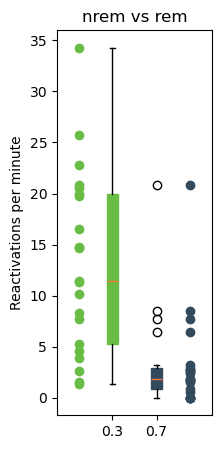

In [4]:



nrem_reactivations_per_min = rem_nrem_master['NREM']['reactivations_per_min']
rem_reactivations_per_min = rem_nrem_master['REM']['reactivations_per_min']


# replace nan values with 0
nrem_reactivations_per_min = [0 if np.isnan(item) else item for item in nrem_reactivations_per_min]
rem_reactivations_per_min = [0 if np.isnan(item) else item for item in rem_reactivations_per_min]


########################################

fig, ax = plt.subplots(figsize=(2, 5))

ax.plot(np.zeros(len(nrem_reactivations_per_min)), nrem_reactivations_per_min, 'o', color = '#69BD45')
ax.boxplot(nrem_reactivations_per_min, positions=[0.3], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#69BD45', color='#69BD45'), medianprops=dict(color='#EE7832'))

ax.plot(np.ones(len(rem_reactivations_per_min)), rem_reactivations_per_min, 'o', color = '#33495C')
ax.boxplot(rem_reactivations_per_min, positions=[0.7], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#33495C', color='#33495C'), medianprops=dict(color='#EE7832'))

ax.set_ylabel('Reactivations per minute')

ax.set_title('nrem vs rem')
SaveFig('nrem_rem_rpm.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')


stats

In [7]:
import scipy

a = [x for x in nrem_reactivations_per_min if not np.isnan(x)]
b = [x for x in rem_reactivations_per_min if not np.isnan(x)]

print(scipy.stats.shapiro(a))
print(scipy.stats.shapiro(b))
# p is not greater than 0.05 for both, so we reject the null hypothesis that the data is normally distributed
#paried t test
# print(scipy.stats.ttest_rel(a, b))
# # print(scipy.stats.ttest_ind(a,b))

# non parametric t test, using scipy Wilcoxon Rank-Sum test
print(scipy.stats.wilcoxon(a, b))

effect_size(x=a, y=b, test='wilcoxon')

ShapiroResult(statistic=np.float64(0.95001474699468), pvalue=np.float64(0.3408676322440977))
ShapiroResult(statistic=np.float64(0.6444587066347733), pvalue=np.float64(6.031976628238641e-06))
WilcoxonResult(statistic=np.float64(14.0), pvalue=np.float64(0.0001049041748046875))


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_9428\3901619665.py:56: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"test": "Wilcoxon signed-rank", "W": res['W-val'][0], "p": res['p-val'][0], "rank_biserial_r": res['RBC'][0]}


{'test': 'Wilcoxon signed-rank',
 'W': np.float64(14.0),
 'p': np.float64(0.0001049041748046875),
 'rank_biserial_r': np.float64(0.8787878787878789)}

# event lengths

C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_9428\988067211.py:7: RuntimeWarning: Mean of empty slice
  rem_event_lens = [np.nanmean(item) for item in rem_event_lens]
C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_9428\988067211.py:8: RuntimeWarning: Mean of empty slice
  linked_event_lens = [np.nanmean(item) for item in linked_event_lens]


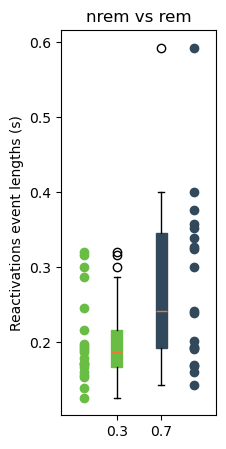

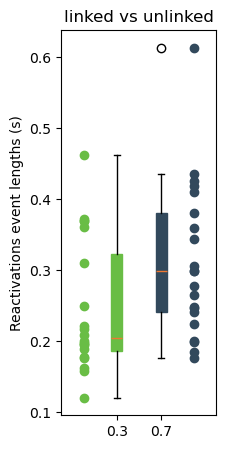

In [92]:
nrem_event_lens = rem_nrem_master['NREM']['event_lens']
rem_event_lens = rem_nrem_master['REM']['event_lens']
linked_event_lens = linked_unlinked_master['linked']['event_lens']
unlinked_event_lens = linked_unlinked_master['unlinked']['event_lens']

nrem_event_lens = [np.nanmean(item) for item in nrem_event_lens]
rem_event_lens = [np.nanmean(item) for item in rem_event_lens]
linked_event_lens = [np.nanmean(item) for item in linked_event_lens]
unlinked_event_lens = [np.nanmean(item) for item in unlinked_event_lens]


##############################################

fig, ax = plt.subplots(figsize=(2, 5))

ax.plot(np.zeros(len(nrem_event_lens)), nrem_event_lens, 'o', color = '#69BD45')
ax.boxplot(nrem_event_lens, positions=[0.3], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#69BD45', color='#69BD45'), medianprops=dict(color='#EE7832'))

ax.plot(np.ones(len(rem_event_lens)), rem_event_lens, 'o', color = '#32495C')
ax.boxplot([x for x in rem_event_lens if not np.isnan(x)], positions=[0.7], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#32495C', color='#32495C'), medianprops=dict(color='#EE7832'))

ax.set_ylabel('Reactivations event lengths (s)')

ax.set_title('nrem vs rem')

SaveFig('nrem_rem_event_lengths.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

##############################################

fig, ax = plt.subplots(figsize=(2, 5))

ax.plot(np.zeros(len(linked_event_lens)), linked_event_lens, 'o', color = '#69BD45')
ax.boxplot([x for x in linked_event_lens if not np.isnan(x)], positions=[0.3], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#69BD45', color='#69BD45'), medianprops=dict(color='#EE7832'))

ax.plot(np.ones(len(unlinked_event_lens)), unlinked_event_lens, 'o', color = '#32495C')
ax.boxplot([x for x in unlinked_event_lens if not np.isnan(x)], positions=[0.7], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#32495C', color='#32495C'), medianprops=dict(color='#EE7832'))

ax.set_ylabel('Reactivations event lengths (s)')

ax.set_title('linked vs unlinked')


SaveFig('linked_unlinked_event_lengths.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')



stats

In [108]:
a = [x for x in nrem_event_lens if not np.isnan(x)]
b = [x for x in rem_event_lens if not np.isnan(x)]

print(scipy.stats.shapiro(a))
print(scipy.stats.shapiro(b))
# p is greater than 0.05 for both, so we fail to reject the null hypothesis that the data is normally distributed
# print(scipy.stats.ttest_ind(a,b))
# non parametric t test, using scipy Wilcoxon Rank-Sum test
print(scipy.stats.wilcoxon(nrem_event_lens, rem_event_lens,nan_policy='omit'))

print(effect_size(x=nrem_event_lens, y=rem_event_lens, test='wilcoxon'))

###########################
print('-------------------')

a = [x for x in linked_event_lens if not np.isnan(x)]
b = [x for x in unlinked_event_lens if not np.isnan(x)]

print(scipy.stats.shapiro(a))
print(scipy.stats.shapiro(b))
# p is greater than 0.05 for both, so we fail to reject the null hypothesis that the data is normally distributed
# print(scipy.stats.ttest_ind(a,b))
# non parametric t test, using scipy Wilcoxon Rank-Sum test
print(scipy.stats.wilcoxon(linked_event_lens, unlinked_event_lens,nan_policy='omit'))

res = pg.wilcoxon(linked_event_lens, unlinked_event_lens, alternative='two-sided', nan_policy="omit")
print({"test": "Wilcoxon signed-rank", "W": res['W-val'][0], "p": res['p-val'][0], "rank_biserial_r": res['RBC'][0]})
print('------------')

ShapiroResult(statistic=np.float64(0.8591460205726613), pvalue=np.float64(0.006130655972736725))
ShapiroResult(statistic=np.float64(0.8874399509718545), pvalue=np.float64(0.028998252261409483))
WilcoxonResult(statistic=np.float64(15.0), pvalue=np.float64(0.000522613525390625))
{'test': 'Wilcoxon signed-rank', 'W': np.float64(15.0), 'p': np.float64(0.000522613525390625), 'rank_biserial_r': np.float64(-0.8421052631578947)}
-------------------
ShapiroResult(statistic=np.float64(0.8663454146686502), pvalue=np.float64(0.010140408277513233))
ShapiroResult(statistic=np.float64(0.9174009687943279), pvalue=np.float64(0.07700374181383939))
WilcoxonResult(statistic=np.float64(45.0), pvalue=np.float64(0.023950576782226562))
{'test': 'Wilcoxon signed-rank', 'W': np.float64(45.0), 'p': np.float64(0.023950576782226562), 'rank_biserial_r': np.float64(-0.5714285714285714)}
------------


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_9428\2630704937.py:56: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"test": "Wilcoxon signed-rank", "W": res['W-val'][0], "p": res['p-val'][0], "rank_biserial_r": res['RBC'][0]}
C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_9428\1217523785.py:27: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print({"test": "Wilcoxon signed-rank", "W": res['W-val'][0], "p": res['p-val'][0], "rank_biserial_r": res['RBC'][0]})


In [105]:
unlinked_event_lens

[np.float64(0.3588378881987743),
 np.float64(0.17608446601941435),
 np.float64(0.2986960784313668),
 np.float64(0.18503407821229342),
 np.float64(0.27804539473683126),
 np.float64(0.3056029850746325),
 np.float64(0.19845000000000765),
 np.float64(0.20014909090907002),
 np.float64(0.2483450450450426),
 np.float64(0.24637096774192718),
 np.float64(0.2651212765957345),
 np.float64(0.37986233766235145),
 np.float64(0.42612777777779026),
 np.float64(0.22343936170213094),
 np.float64(0.6130296296296701),
 np.float64(0.343127500000071),
 np.float64(0.298920000000021),
 np.float64(0.4355413333333672),
 np.float64(0.4188285714284835),
 np.float64(0.24146923076923835),
 np.float64(0.4099375000000123)]

In [104]:
mask

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False,  True,  True,  True,
        True,  True,  True])

In [103]:
linked_event_lens

[np.float64(0.4616000000001804),
 np.float64(0.20064814814816567),
 np.float64(0.3095818181818066),
 np.float64(0.12021499999996191),
 np.float64(0.20872500000001537),
 np.float64(0.37176000000002507),
 np.float64(0.16240666666664968),
 np.float64(0.15763396226420467),
 np.float64(0.21665588235293853),
 np.float64(0.17613846153847132),
 np.float64(0.19491935483872494),
 np.float64(0.19578000000001336),
 np.float64(0.17752500000000276),
 np.float64(0.24943333333330883),
 np.float64(nan),
 np.float64(0.22149999999984563),
 np.float64(0.1893352941176678),
 np.float64(0.36917647058823927),
 np.float64(0.19799999999986534),
 np.float64(0.3608857142856842),
 np.float64(0.3695833333332909)]

# warp 

In [109]:
import scipy

def conactinate_nth_items(startlist):
    concatinated_column_vectors = []
    for c in range(len(max(startlist, key=len))):
        column = []
        for t in range(len(startlist)):
            if c <= len(startlist[t])-1:
                column = column + [startlist[t][c]]
        concatinated_column_vectors.append(column)
    return concatinated_column_vectors

def find_closest_example(numbers, examples):
    # Initialize dictionaries to store the closest example and example totals
    closest_examples = {}
    example_totals = {example: 0 for example in examples}

    # Iterate over each number in the list
    for number in numbers:
        # Initialize a variable to keep track of the closest example
        closest_example = None
        min_distance = float('inf')  # Initialize the minimum distance to infinity

        # Compare the number with each example
        for example in examples:
            # Calculate the absolute difference between the number and example
            distance = abs(number - example)

            # Check if the current example is closer than the previous closest example
            if distance < min_distance:
                min_distance = distance
                closest_example = example

        # Update the closest example for the current number in the dictionary
        closest_examples[number] = closest_example

        # Increment the total count for the closest example
        example_totals[closest_example] += 1

    return closest_examples, example_totals

def relative_warp_values(e_f_warp_factors):
    rels = []
    for item in e_f_warp_factors:
        if sum(item) > 0:
            # normalize the warp factors to sum to 1
            rels += [list(np.array(item)/sum(item))]
    return rels



bins_ = [0.1, 0.2, 1,2, 5, 10,20,40]

def extract_mean_warps(regression_df, bins_,animals_list):

    f_warp_factors = []
    r_warp_factors = []

    forward = []
    reverse = []
    
    forward_total = []
    reverse_total = []

    for mouse in animals_list:
        mask = regression_df.mouse == mouse
        group = regression_df[mask]
        #forward:
        data = list(group.warp_factor.values[group.warp_factor.values > 0])
        forward_total += [len(data)]
        closest_examples,example_totals = find_closest_example(data,bins_)
        f_warp_factors +=[list(example_totals.values())]
        forward += [sum(example_totals.values())]
        #reverse:
        data = list(abs(group.warp_factor.values[group.warp_factor.values < 0]))
        reverse_total += [len(data)]
        closest_examples,example_totals = find_closest_example(data,bins_)
        r_warp_factors +=[list(example_totals.values())]
        reverse += [sum(example_totals.values())]


            
    f_warp_factors = relative_warp_values(f_warp_factors)
    r_warp_factors = relative_warp_values(r_warp_factors)
    
    return f_warp_factors, r_warp_factors, forward_total, reverse_total

def plot_warp_factors(ax, f_warp_factors, r_warp_factors, bins_, color_):

    bin_labels = [item + 'x' for item in np.array(bins_).astype(str)]

    means = []
    sems = []
    for item in conactinate_nth_items(f_warp_factors):
        means += [np.mean(item)]
        sems += [scipy.stats.sem(item)]
    ax.plot(means,'-->', color = color_, markersize = 8, label = 'forward')
    upper = np.array(means)+ sems
    lower = np.array(means)- sems
    ax.fill_between((range(len(bin_labels))),(lower),(upper),
        alpha=0.2, edgecolor='None', facecolor=color_,
        linewidth=1, linestyle='dashdot', antialiased=True)

    means = []
    sems = []
    for item in conactinate_nth_items(r_warp_factors):
        means += [np.mean(item)]
        sems += [scipy.stats.sem(item)]
    ax.plot(means,'--<', color = color_, markersize = 8,label = 'reverse')
    upper = np.array(means)+ sems
    lower = np.array(means)- sems
    ax.fill_between((range(len(bin_labels))),(lower),(upper),
        alpha=0.2, edgecolor='None', facecolor=color_,
        linewidth=1, linestyle='dashdot', antialiased=True)


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_9428\562505716.py:7: RuntimeWarning: invalid value encountered in divide
  rem_proportion_forward_v_reverse = np.array(rem_forward_total)/np.array(rem_reverse_total)


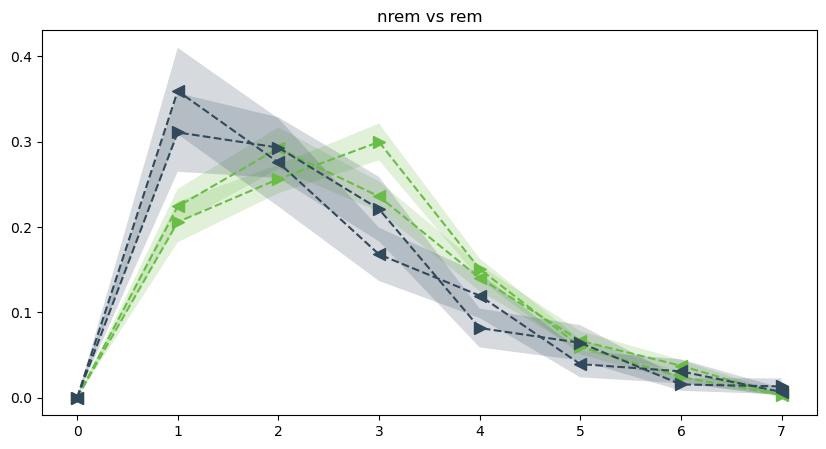

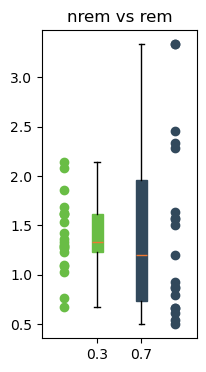

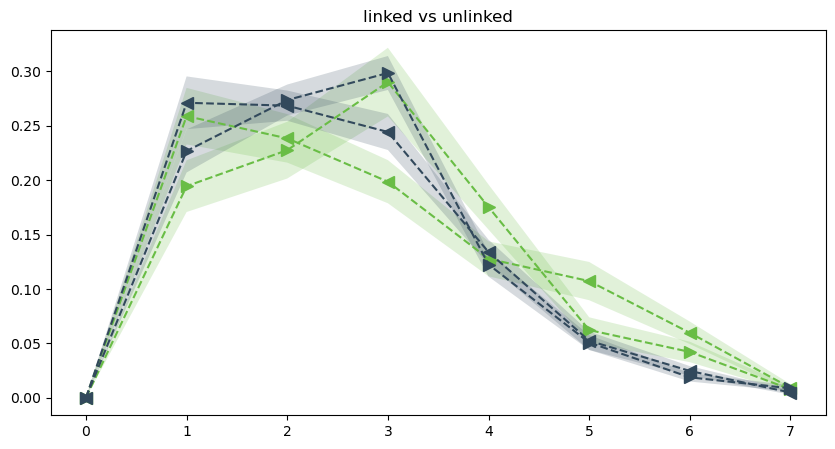

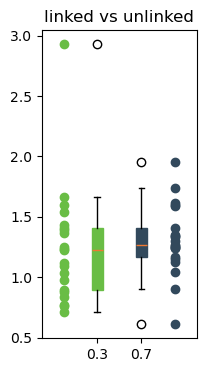

In [110]:
bins_ = [0.1, 0.2, 1,2, 5, 10,20,40]
animals_list = rem_nrem_master['NREM']['animals']

nrem_f_warp_factors, nrem_r_warp_factors, nrem_forward_total, nrem_reverse_total = extract_mean_warps(pd.DataFrame(rem_nrem_master['NREM']['regression']), bins_,animals_list)
nrem_proportion_forward_v_reverse = np.array(nrem_forward_total)/np.array(nrem_reverse_total)
rem_f_warp_factors, rem_r_warp_factors, rem_forward_total, rem_reverse_total = extract_mean_warps(pd.DataFrame(rem_nrem_master['REM']['regression']), bins_,animals_list)
rem_proportion_forward_v_reverse = np.array(rem_forward_total)/np.array(rem_reverse_total)

###############################################################

fig,ax = plt.subplots(1, 1,figsize=(10, 5))
color_ = '#69BD45'
plot_warp_factors(ax, nrem_f_warp_factors, nrem_r_warp_factors, bins_, color_)
color_ = '#32495C'
plot_warp_factors(ax, rem_f_warp_factors, rem_r_warp_factors, bins_, color_)
ax.set_title('nrem vs rem')

SaveFig('warp_rem_nrem.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

fig, ax = plt.subplots(figsize=(2, 4))
ax.plot(np.zeros(len(nrem_proportion_forward_v_reverse)),nrem_proportion_forward_v_reverse,'o', color = '#69BD45')
ax.boxplot([x for x in nrem_proportion_forward_v_reverse if not np.isnan(x)], positions=[0.3], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#69BD45', color='#69BD45'), medianprops=dict(color='#EE7832'))
ax.plot(np.ones(len(rem_proportion_forward_v_reverse)),rem_proportion_forward_v_reverse,'o', color = '#32495C')
ax.boxplot([x for x in rem_proportion_forward_v_reverse if not np.isnan(x)], positions=[0.7], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#32495C', color='#32495C'), medianprops=dict(color='#EE7832'))
ax.set_title('nrem vs rem')

SaveFig('warp_rem_nrem_forward_backward.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')


###############################################################

linked_f_warp_factors, linked_r_warp_factors, linked_forward_total, linked_reverse_total = extract_mean_warps(pd.DataFrame(linked_unlinked_master['linked']['regression']), bins_,animals_list)
linked_proportion_forward_v_reverse = np.array(linked_forward_total)/np.array(linked_reverse_total)
unlinked_f_warp_factors, unlinked_r_warp_factors, unlinked_forward_total, unlinked_reverse_total = extract_mean_warps(pd.DataFrame(linked_unlinked_master['unlinked']['regression']), bins_,animals_list)
unlinked_proportion_forward_v_reverse = np.array(unlinked_forward_total)/np.array(unlinked_reverse_total)

###############################################################

fig,ax = plt.subplots(1, 1,figsize=(10, 5))
color_ = '#69BD45'
plot_warp_factors(ax, linked_f_warp_factors, linked_r_warp_factors, bins_, color_)
color_ = '#32495C'
plot_warp_factors(ax, unlinked_f_warp_factors, unlinked_r_warp_factors, bins_, color_)
ax.set_title('linked vs unlinked')

SaveFig('warp_linked_unlinked.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

fig, ax = plt.subplots(figsize=(2, 4))
ax.plot(np.zeros(len(linked_proportion_forward_v_reverse)),linked_proportion_forward_v_reverse,'o', color = '#69BD45')
ax.boxplot([x for x in linked_proportion_forward_v_reverse if not np.isnan(x)], positions=[0.3], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#69BD45', color='#69BD45'), medianprops=dict(color='#EE7832'))
ax.plot(np.ones(len(unlinked_proportion_forward_v_reverse)),unlinked_proportion_forward_v_reverse,'o', color = '#32495C')
ax.boxplot([x for x in unlinked_proportion_forward_v_reverse if not np.isnan(x)], positions=[0.7], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#32495C', color='#32495C'), medianprops=dict(color='#EE7832'))
ax.set_title('linked vs unlinked')

SaveFig('warp_linked_unlinked_forward_backward.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

stats for INSET: forward vs reverse

In [117]:
from scipy.stats import shapiro
from scipy.stats import ttest_1samp

# Perform one-sample t-test
statistic, p_value = ttest_1samp(nrem_proportion_forward_v_reverse, 1.0)
# Print the test statistic and p-value
print("Test statistic:", statistic)
print("P-value:", p_value)
print(effect_size(x=nrem_proportion_forward_v_reverse,test='one_sample_ttest',popmean = 1))

print('--------------------')
# Perform one-sample t-test
statistic, p_value = ttest_1samp(rem_proportion_forward_v_reverse, 1.0, nan_policy="omit")
# Print the test statistic and p-value
print("Test statistic:", statistic)
print("P-value:", p_value)
rem_proportion_forward_v_reverse = rem_proportion_forward_v_reverse[~np.isnan(rem_proportion_forward_v_reverse)]
print(effect_size(x=rem_proportion_forward_v_reverse,test='one_sample_ttest',popmean = 1))

print('--------------------')
# Perform one-sample t-test
statistic, p_value = ttest_1samp(linked_proportion_forward_v_reverse, 1.0)
# Print the test statistic and p-value
print("Test statistic:", statistic)
print("P-value:", p_value)
print(effect_size(x=linked_proportion_forward_v_reverse,test='one_sample_ttest',popmean = 1))

print('--------------------')
# Perform one-sample t-test
statistic, p_value = ttest_1samp(unlinked_proportion_forward_v_reverse, 1.0, nan_policy="omit")
# Print the test statistic and p-value
print("Test statistic:", statistic)
print("P-value:", p_value)
print(effect_size(x=unlinked_proportion_forward_v_reverse,test='one_sample_ttest',popmean = 1))


# rem_proportion_forward_v_reverse = rem_proportion_forward_v_reverse[~np.isnan(rem_proportion_forward_v_reverse)]
# print(effect_size(x=rem_proportion_forward_v_reverse,test='one_sample_ttest',popmean = 1))

Test statistic: 4.842569309810121
P-value: 9.879016900263175e-05
{'cohens_d': np.float64(1.0567352581083302)}
--------------------
Test statistic: 2.1967803967615267
P-value: 0.041373113936092505
{'cohens_d': np.float64(0.5039759868755095)}
--------------------
Test statistic: 2.3095942194862547
P-value: 0.031710042340827735
{'cohens_d': np.float64(0.503994777877534)}
--------------------
Test statistic: 4.866774290055714
P-value: 9.341924923733473e-05
{'cohens_d': np.float64(1.0620172178307277)}


In [120]:

print(scipy.stats.shapiro(nrem_proportion_forward_v_reverse))
print(scipy.stats.shapiro(rem_proportion_forward_v_reverse))
print(scipy.stats.shapiro(linked_proportion_forward_v_reverse))
print(scipy.stats.shapiro(unlinked_proportion_forward_v_reverse))

## not all normal so use wilcoxn signed rank
# print(scipy.stats.wilcoxon(nrem_proportion_forward_v_reverse, rem_proportion_forward_v_reverse,nan_policy='omit'))
# print(effect_size(x=nrem_proportion_forward_v_reverse, y=rem_proportion_forward_v_reverse, test='wilcoxon'))
print('------------------------------------------')
print(scipy.stats.wilcoxon(linked_proportion_forward_v_reverse, unlinked_proportion_forward_v_reverse, nan_policy='omit'))
print(effect_size(x=linked_proportion_forward_v_reverse, y=unlinked_proportion_forward_v_reverse, test='wilcoxon'))



ShapiroResult(statistic=np.float64(0.9733893142536775), pvalue=np.float64(0.8063137657213336))
ShapiroResult(statistic=np.float64(0.8683506866354792), pvalue=np.float64(0.013539079994095968))
ShapiroResult(statistic=np.float64(0.8035892796189777), pvalue=np.float64(0.0007447922912890895))
ShapiroResult(statistic=np.float64(0.960275394449744), pvalue=np.float64(0.5216901344904668))
------------------------------------------
WilcoxonResult(statistic=np.float64(75.0), pvalue=np.float64(0.16780662536621094))
{'test': 'Wilcoxon signed-rank', 'W': np.float64(75.0), 'p': np.float64(0.16780662536621094), 'rank_biserial_r': np.float64(-0.35064935064935066)}


C:\Users\Emmett Thompson\AppData\Local\Temp\ipykernel_9428\2630704937.py:56: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return {"test": "Wilcoxon signed-rank", "W": res['W-val'][0], "p": res['p-val'][0], "rank_biserial_r": res['RBC'][0]}


stats for warps - check normality

In [26]:
#check normality 


print(scipy.stats.shapiro([item for sublist in nrem_f_warp_factors for item in sublist]))
print(scipy.stats.shapiro([item for sublist in nrem_r_warp_factors for item in sublist]))

print(scipy.stats.shapiro([item for sublist in rem_f_warp_factors for item in sublist]))
print(scipy.stats.shapiro([item for sublist in rem_r_warp_factors for item in sublist]))

print(scipy.stats.shapiro([item for sublist in linked_f_warp_factors for item in sublist]))
print(scipy.stats.shapiro([item for sublist in linked_r_warp_factors for item in sublist]))

print(scipy.stats.shapiro([item for sublist in unlinked_f_warp_factors for item in sublist]))
print(scipy.stats.shapiro([item for sublist in unlinked_r_warp_factors for item in sublist]))

print(' all are not normally distributed, so we will use a non-parametric test')

ShapiroResult(statistic=np.float64(0.8719594035128703), pvalue=np.float64(8.725500708879532e-11))
ShapiroResult(statistic=np.float64(0.8769455382335526), pvalue=np.float64(1.570390357101192e-10))
ShapiroResult(statistic=np.float64(0.7607403519055269), pvalue=np.float64(1.8345744418487906e-14))
ShapiroResult(statistic=np.float64(0.7197401190308279), pvalue=np.float64(1.0866055011493742e-15))
ShapiroResult(statistic=np.float64(0.8576212731786002), pvalue=np.float64(1.744496463167943e-11))
ShapiroResult(statistic=np.float64(0.8924007850346327), pvalue=np.float64(1.0779793335912844e-09))
ShapiroResult(statistic=np.float64(0.8677207709454446), pvalue=np.float64(5.357105250836415e-11))
ShapiroResult(statistic=np.float64(0.8754718610456639), pvalue=np.float64(1.317897591120251e-10))
 all are not normally distributed, so we will use a non-parametric test


permanova - forward vs reverse

In [121]:
# PERMANOVA forward vs reverse diff
from skbio.stats.distance import permanova, DistanceMatrix
from scipy.spatial.distance import pdist, squareform

def permanova_forward_vs_reverse(f_warp_factors, r_warp_factors):
    grouping = ['control_forwards']*len(np.vstack(f_warp_factors)) + ['control_reverse']*len(np.vstack(r_warp_factors))

    pairwise_distances = pdist(np.asarray(f_warp_factors+r_warp_factors), metric='euclidean')
    distance_matrix = squareform(pairwise_distances)
    dm = DistanceMatrix(distance_matrix)

    # Perform PERMANOVA
    results = permanova(dm, grouping, permutations=10000)
    print(results)
    
    #Compute R² manually (effect size)
    # ss_total = sum of squared distances / n
    D = dm.data        # <-- this is the fix
    n = len(grouping)
    ss_total = np.sum(D**2) / n

    # ss_between: sum of squared group means
    group_labels = np.array(grouping)
    unique_groups = np.unique(group_labels)
    ss_between = 0
    for g in unique_groups:
        idx = np.where(group_labels == g)[0]
        Di = D[np.ix_(idx, idx)]
        ss_between += len(idx) * (Di.mean() ** 2)

    r2 = ss_between / ss_total
    print(f"PERMANOVA effect size R²: {r2:.5f}")
    
permanova_forward_vs_reverse(nrem_f_warp_factors, nrem_r_warp_factors)
print('-------------------')
permanova_forward_vs_reverse(rem_f_warp_factors, rem_r_warp_factors)
print('-------------------')
permanova_forward_vs_reverse(linked_f_warp_factors, linked_r_warp_factors)
print('-------------------')
permanova_forward_vs_reverse(unlinked_f_warp_factors, unlinked_r_warp_factors)

method name               PERMANOVA
test statistic name        pseudo-F
sample size                      42
number of groups                  2
test statistic             1.829908
p-value                    0.138086
number of permutations        10000
Name: PERMANOVA results, dtype: object
PERMANOVA effect size R²: 0.75207
-------------------
method name               PERMANOVA
test statistic name        pseudo-F
sample size                      38
number of groups                  2
test statistic             0.588827
p-value                    0.651235
number of permutations        10000
Name: PERMANOVA results, dtype: object
PERMANOVA effect size R²: 0.72938
-------------------
method name               PERMANOVA
test statistic name        pseudo-F
sample size                      42
number of groups                  2
test statistic             3.345871
p-value                    0.010599
number of permutations        10000
Name: PERMANOVA results, dtype: object
PERMANOVA effect si

permanova groups 

In [122]:
def group_difference_permanova(f_warp_factors, r_warp_factors, learning_f_warp_factors, learning_r_warp_factors):

    # grouping = ['control_forwards']*len(np.vstack(e_f_warp_factors)) + ['control_reverse']*len(np.vstack(e_r_warp_factors)) + ['lesion_forwards']*len(np.vstack(hl_f_warp_factors)) + ['lesion_reverse']*len(np.vstack(hl_r_warp_factors))
    grouping = ['control']*len(np.vstack(f_warp_factors)) + ['control']*len(np.vstack(r_warp_factors)) + ['test']*len(np.vstack(learning_f_warp_factors)) + ['test']*len(np.vstack(learning_r_warp_factors))
    # data is stacked so that each row is a sample (animal) and each colum is a variable/test

    pairwise_distances = pdist(np.asarray(f_warp_factors+r_warp_factors+learning_f_warp_factors+learning_r_warp_factors), metric='euclidean')

    distance_matrix = squareform(pairwise_distances)
    dm = DistanceMatrix(distance_matrix)

    # Perform PERMANOVA
    results = permanova(dm, grouping, permutations=10000)
    print(results)
    
    #Compute R² manually (effect size)
    # ss_total = sum of squared distances / n
    D = dm.data        # <-- this is the fix
    n = len(grouping)
    ss_total = np.sum(D**2) / n

    # ss_between: sum of squared group means
    group_labels = np.array(grouping)
    unique_groups = np.unique(group_labels)
    ss_between = 0
    for g in unique_groups:
        idx = np.where(group_labels == g)[0]
        Di = D[np.ix_(idx, idx)]
        ss_between += len(idx) * (Di.mean() ** 2)

    r2 = ss_between / ss_total
    print(f"PERMANOVA effect size R²: {r2:.5f}")
    
    return grouping

# PERMANOVA late vs early diff
el_grouping = group_difference_permanova(nrem_f_warp_factors, nrem_f_warp_factors, rem_f_warp_factors, rem_f_warp_factors)
print('------------------- ')
# PERMANOVA late vs early diff
eh_grouping = group_difference_permanova(linked_f_warp_factors, linked_f_warp_factors, unlinked_f_warp_factors, unlinked_f_warp_factors)


method name               PERMANOVA
test statistic name        pseudo-F
sample size                      80
number of groups                  2
test statistic             6.813006
p-value                      0.0002
number of permutations        10000
Name: PERMANOVA results, dtype: object
PERMANOVA effect size R²: 0.68884
------------------- 
method name               PERMANOVA
test statistic name        pseudo-F
sample size                      84
number of groups                  2
test statistic              3.49301
p-value                    0.014199
number of permutations        10000
Name: PERMANOVA results, dtype: object
PERMANOVA effect size R²: 0.75477


post-hoc comparisions

In [123]:
import numpy as np
from itertools import combinations
from skbio import DistanceMatrix
from skbio.stats.distance import permanova
from statsmodels.stats.multitest import multipletests
from scipy.spatial.distance import pdist, squareform

def pairwise_permanova_by_feature(data, group_labels, method='bonferroni', permutations=10000):
    """
    Perform pairwise PERMANOVA on each feature column, correcting p-values
    across all feature×pairwise tests. For any pair where the feature is
    constant, record statistic=0, p_value=1 instead of running PERMANOVA.
    Returns a list of dicts:
      feature, group1, group2, test_stat, p_value, permutations
    """
    unique_groups = np.unique(group_labels)
    pairwise_combinations = list(combinations(unique_groups, 2))

    results = []
    all_pvals = []

    n_features = data.shape[1]

    for feat_idx in range(n_features):
        feat = data[:, feat_idx]

        for g1, g2 in pairwise_combinations:
            mask = np.isin(group_labels, [g1, g2])
            sub_feat = feat[mask]
            sub_labels = group_labels[mask]

            # If the feature is constant across these two groups, skip PERMANOVA:
            if np.unique(sub_feat).size == 1:
                stat, pval = 0.0, 1.0
                r2 = 0
            else:
                # Compute distances and run PERMANOVA
                dist_mat = squareform(pdist(sub_feat[:, None], metric='euclidean'))
                dist_mat = np.ascontiguousarray(dist_mat)
                ids = [str(i) for i in range(len(sub_labels))]
                dm = DistanceMatrix(dist_mat, ids)
                res = permanova(dm, sub_labels, permutations=permutations)
                stat, pval = res["test statistic"], res["p-value"]
                
                #Compute R² manually (effect size)
                # ss_total = sum of squared distances / n
                D = dm.data        # <-- this is the fix
                n = len(sub_labels)
                ss_total = np.sum(D**2) / n

                # ss_between: sum of squared group means
                group_labels = np.array(sub_labels)
                unique_groups = np.unique(group_labels)
                ss_between = 0
                for g in unique_groups:
                    idx = np.where(group_labels == g)[0]
                    Di = D[np.ix_(idx, idx)]
                    ss_between += len(idx) * (Di.mean() ** 2)

                r2 = ss_between / ss_total

            results.append({
                "feature": feat_idx,
                "group1": g1,
                "group2": g2,
                "test_stat": stat,
                "p_value": pval,
                "permutations": permutations,
                "R2": r2
            })
            all_pvals.append(pval)

    # Multiple testing correction
    corrected = multipletests(all_pvals, method=method)[1]
    for i, cp in enumerate(corrected):
        results[i]["p_value"] = cp
        
    return results

####################################################################################

# rem vs nrem learning

# Combine them correctly:
combined_data = np.vstack([
    np.asarray(nrem_f_warp_factors),
    np.asarray(nrem_r_warp_factors),
    np.asarray(rem_f_warp_factors),
    np.asarray(rem_r_warp_factors)
])
combined_labels = np.array(el_grouping)

feature_results = pairwise_permanova_by_feature(
    combined_data,
    combined_labels,
    method='bonferroni',
    permutations=10000
)

print("Significant feature-wise pairwise PERMANOVA results (α=0.05):")
for res in feature_results:
    p = res["p_value"]
    if p < 0.05:
        stars = '***' if p < 0.001 else '**' if p < 0.01 else '*'
        print(f"Feature {res['feature']}: {res['group1']} vs {res['group2']}")
        print(f"  statistic = {res['test_stat']:.4f}, p (corr.) = {p:.4g} {stars}")
        print(f"R2 = {res['R2']}")
        print("---")
        
print('_-_-_-__-_-_-__-_-_-__-_-_-__-_-_-__-_-_-__-_-_-_')  

#### linked vs unlinked

# Combine them correctly:
combined_data = np.vstack([
    np.asarray(linked_f_warp_factors),
    np.asarray(linked_r_warp_factors),
    np.asarray(unlinked_f_warp_factors),
    np.asarray(unlinked_r_warp_factors)
])
combined_labels = np.array(eh_grouping)

feature_results = pairwise_permanova_by_feature(
    combined_data,
    combined_labels,
    method='bonferroni',
    permutations=10000
)

print("Significant feature-wise pairwise PERMANOVA results (α=0.05):")
for res in feature_results:
    p = res["p_value"]
    if p < 0.05:
        stars = '***' if p < 0.001 else '**' if p < 0.01 else '*'
        print(f"Feature {res['feature']}: {res['group1']} vs {res['group2']}")
        print(f"  statistic = {res['test_stat']:.4f}, p (corr.) = {p:.4g} {stars}")
        print(f"R2 = {res['R2']}")
        print("---")
        

Significant feature-wise pairwise PERMANOVA results (α=0.05):
Feature 1: control vs test
  statistic = 10.9707, p (corr.) = 0.006399 **
R2 = 0.41321520268744677
---
_-_-_-__-_-_-__-_-_-__-_-_-__-_-_-__-_-_-__-_-_-_
Significant feature-wise pairwise PERMANOVA results (α=0.05):
Feature 6: control vs test
  statistic = 14.6165, p (corr.) = 0.0016 **
R2 = 0.518989634278222
---


# reactivation rate vs time 

In [55]:
def plot_decay(nrem_binned_rate,nrem_bins_relative_so,rem_binned_rate,rem_bins_relative_so,color_1, color_2, title_):
    fig,ax = plt.subplots(1, 1,figsize=(7, 5))
    AA_rate = []
    AA_post_so_time = []
    times = []
    rates = []
    for i,item in enumerate(nrem_binned_rate):
        across_chunks_x = []
        across_chunks_y = []
        for e,chunk_item in enumerate(item):
            #mean for each time series across chunks
            across_chunks_x += [np.mean(nrem_bins_relative_so[i][e])]
            across_chunks_y += [np.mean(chunk_item)]
        AA_rate+=[across_chunks_y]
        AA_post_so_time+=[across_chunks_x]
        ax.plot(across_chunks_x,across_chunks_y, '-o',c = color_1, alpha = 1, markersize = 10, markeredgewidth = 0)
        # save out stuff for plot 2
        rate_change_per_min = np.diff(across_chunks_y)/np.diff(across_chunks_x)
        times += across_chunks_y[0:-1]
        rates += list(rate_change_per_min)
        
    AA_rate = []
    AA_post_so_time = []
    times_2 = []
    rates_2 = []
    for i,item in enumerate(rem_binned_rate):
        across_chunks_x = []
        across_chunks_y = []
        for e,chunk_item in enumerate(item):
            #mean for each time series across chunks
            across_chunks_x += [np.mean(rem_bins_relative_so[i][e])]
            across_chunks_y += [np.mean(chunk_item)]
        AA_rate+=[across_chunks_y]
        AA_post_so_time+=[across_chunks_x]
        ax.plot(across_chunks_x,across_chunks_y, '-o',c = color_2, alpha = 1, markersize = 10, markeredgewidth = 0)
        # save out stuff for plot 2
        rate_change_per_min = np.diff(across_chunks_y)/np.diff(across_chunks_x)
        times_2 += across_chunks_y[0:-1]
        rates_2 += list(rate_change_per_min)
        
    ax.set_title(title_)
    ax.set_xlabel('time after sleep onset (mins)')
    
    SaveFig(title_ + 'decay.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

    fig,ax = plt.subplots(1, 1,figsize=(5, 5))                
    sns.regplot(x=times, y=rates, ax = ax, color = color_1,scatter_kws={'s': 160, 'alpha': 0.3,'linewidths': 0})
    sns.regplot(x=times_2, y=rates_2, ax = ax, color = color_2,scatter_kws={'s': 160, 'alpha': 0.3,'linewidths': 0})
    ax.set_xlabel('starting rate')
    ax.set_ylabel('rate change per minute')
    ax.axhline(0,0,ls ='--')
    
    group1_data = {'x': times, 'y': rates}
    group2_data = {'x': times_2, 'y': rates_2}
    SaveFig(title_ + 'decay_rate.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')
    return group1_data, group2_data

nrem vs rem

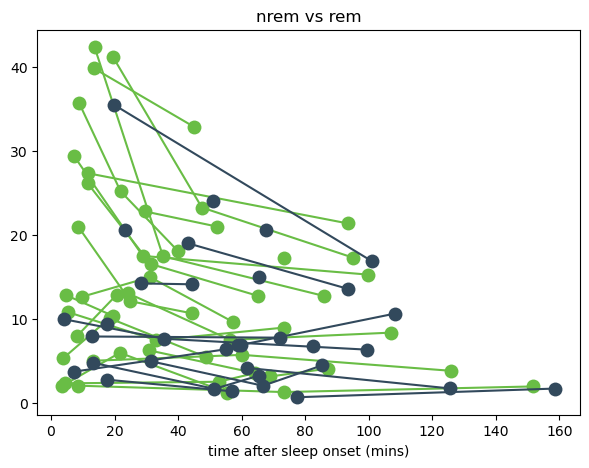

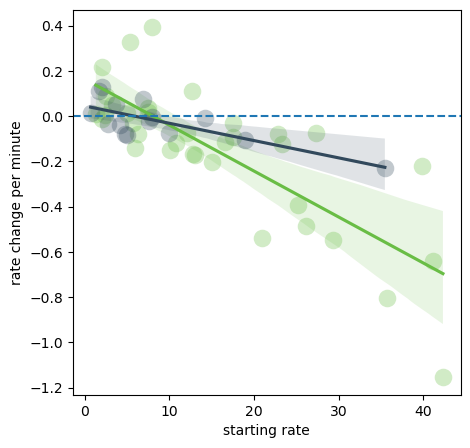

PLOT 2:
Group 1 (NREM):
model p value (f statistic) = 
1.3697638512096542e-08
r2 = 
0.6285434184921949
Group 2 (REM):
model p value (f statistic) = 
0.0015110774687287218
r2 = 
0.5517676658644819


In [66]:
group1_data, group2_data = plot_decay(rem_nrem_master['NREM']['binned_rate']  ,rem_nrem_master['NREM']['bins_relative_so'],rem_nrem_master['REM']['binned_rate']  ,rem_nrem_master['REM']['bins_relative_so'], '#69BD45','#32495C','nrem vs rem')

###################### STATS
df1 = pd.DataFrame(group1_data)
df2 = pd.DataFrame(group2_data)
# Fit linear regression for Group 1
model_group1 = sm.OLS.from_formula('y ~ x', data=df1).fit()
model_group2 = sm.OLS.from_formula('y ~ x', data=df2).fit()

print('PLOT 2:')
# Print the summary of each model
print("Group 1 (NREM):")
# print(model_group1.summary())
print('model p value (f statistic) = ')
print(model_group1.f_pvalue)
print('r2 = ')
print(model_group1.rsquared)

print("Group 2 (REM):")
# print(model_group1.summary())
print('model p value (f statistic) = ')
print(model_group2.f_pvalue)
print('r2 = ')
print(model_group2.rsquared)



stats

In [67]:
### stats 

### effect of decay - significance

import statsmodels.api as sm

# Add a constant term to the independent variable
data = sm.add_constant(df2)
# data = sm.add_constant(df2)

# Fit the regression model
model = sm.OLS(data['y'], data[['const', 'x']],missing='drop').fit()

# Print the summary statistics
print(model.summary())

r = np.sign(model.params['x']) * np.sqrt(model.rsquared)

print(r)
print(model.rsquared)
print(model.pvalues['x'])

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.552
Model:                            OLS   Adj. R-squared:                  0.517
Method:                 Least Squares   F-statistic:                     16.00
Date:                Fri, 05 Sep 2025   Prob (F-statistic):            0.00151
Time:                        11:44:28   Log-Likelihood:                 21.000
No. Observations:                  15   AIC:                            -38.00
Df Residuals:                      13   BIC:                            -36.58
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0452      0.023      1.956      0.0

c:\miniconda\envs\analysis_main\lib\site-packages\scipy\stats\_axis_nan_policy.py:430: UserWarning: `kurtosistest` p-value may be inaccurate with fewer than 20 observations; only n=15 observations were given.
  return hypotest_fun_in(*args, **kwds)


In [68]:
import statsmodels.api as sm
from statsmodels.multivariate.manova import MANOVA

# Function to compute partial eta-squared from Wilks' Lambda
def compute_partial_eta_squared(manova_results):
    eta_dict = {}
    for effect, stats in manova_results.results.items():
        # Use the current effect, not always 'group'
        wilks_lambda = stats['stat'].loc["Wilks' lambda", 'Value']
        eta_p2 = 1 - wilks_lambda
        eta_dict[effect] = eta_p2
    return eta_dict

# Combine the data into one DataFrame
data = pd.concat([df1, df2], axis=0)

# Create a grouping variable
groups = np.array(['nrem'] * len(df1) + ['rem'] * len(df2))

# Perform MANOVA
manova = MANOVA.from_formula('x + y ~ groups', data=data)

# Print the MANOVA results
print(manova.mv_test())

# Compute partial eta-squared
eta_squared = compute_partial_eta_squared(manova.mv_test())
print("Partial eta-squared for each effect:", eta_squared)

                 Multivariate linear model
                                                            
------------------------------------------------------------
       Intercept        Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.3590 2.0000 47.0000 41.9677 0.0000
         Pillai's trace 0.6410 2.0000 47.0000 41.9677 0.0000
 Hotelling-Lawley trace 1.7859 2.0000 47.0000 41.9677 0.0000
    Roy's greatest root 1.7859 2.0000 47.0000 41.9677 0.0000
------------------------------------------------------------
                                                            
------------------------------------------------------------
         groups         Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.9222 2.0000 47.0000  1.9837 0.1489
         Pillai's trace 0.0778 2.0000 47.0000  1.9837 0.1489
 Hotelling-Lawley trace 0.0844 2.0000 47.0

linked vs unlinked

In [59]:
from typing import List, Union
import math

# Define a type for nested lists of numbers
Nested = Union[float, List['Nested']]

def flatten(data: Nested) -> List[float]:
    """Recursively pull out all numeric values into a flat list."""
    if isinstance(data, list):
        vals = []
        for item in data:
            vals.extend(flatten(item))
        return vals
    else:
        return [data]

def compute_stats(flat_vals: List[float]) -> (float, float):
    """Return mean and standard deviation of a list of numbers."""
    n = len(flat_vals)
    mean = sum(flat_vals) / n
    var  = sum((x - mean)**2 for x in flat_vals) / n
    return mean, math.sqrt(var)

def zscoreize(data: Nested, mean: float, std: float) -> Nested:
    """
    Recursively replace each numeric entry by its z-score.
    Leaves the nesting structure intact.
    """
    if isinstance(data, list):
        return [zscoreize(item, mean, std) for item in data]
    else:
        return (data - mean) / std

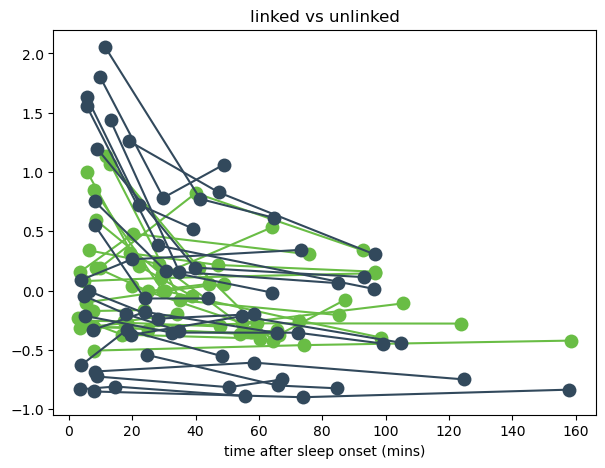

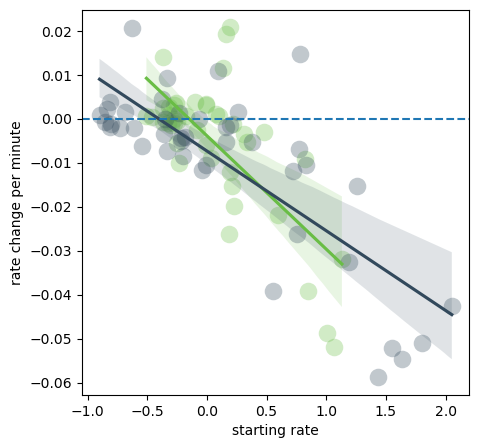

PLOT 2:
Group 1 (NREM):
model p value (f statistic) = 
1.171074257444353e-07
r2 = 
0.5083580633447451
Group 2 (REM):
model p value (f statistic) = 
6.162192561814503e-10
r2 = 
0.61090922284271


In [60]:
# 1. Flatten
flat = flatten(linked_unlinked_master['linked']['binned_rate'])
# 2. Compute mean & std
mean = np.nanmean(flat)
std = np.nanstd(flat)
# 3. Recurse to z-score
normalized_linked = zscoreize(linked_unlinked_master['linked']['binned_rate'], mean, std)


# 1. Flatten
flat = flatten(linked_unlinked_master['unlinked']['binned_rate'])
# 2. Compute mean & std
mean = np.nanmean(flat)
std = np.nanstd(flat)
# 3. Recurse to z-score
normalized_unlinked = zscoreize(linked_unlinked_master['unlinked']['binned_rate'], mean, std)


group1_data, group2_data = plot_decay(normalized_linked  ,linked_unlinked_master['linked']['bins_relative_so'],normalized_unlinked ,linked_unlinked_master['unlinked']['bins_relative_so'], '#69BD45','#32495C','linked vs unlinked')

# expert_master['binned_rate']    
# expert_master['bins_relative_so']

###################### STATS
df1 = pd.DataFrame(group1_data)
df2 = pd.DataFrame(group2_data)
# Fit linear regression for Group 1
model_group1 = sm.OLS.from_formula('y ~ x', data=df1).fit()
model_group2 = sm.OLS.from_formula('y ~ x', data=df2).fit()

print('PLOT 2:')
# Print the summary of each model
print("Group 1 (NREM):")
# print(model_group1.summary())
print('model p value (f statistic) = ')
print(model_group1.f_pvalue)
print('r2 = ')
print(model_group1.rsquared)

print("Group 2 (REM):")
# print(model_group1.summary())
print('model p value (f statistic) = ')
print(model_group2.f_pvalue)
print('r2 = ')
print(model_group2.rsquared)

In [61]:
### stats 

### effect of decay - significance

import statsmodels.api as sm

# Add a constant term to the independent variable
# data = sm.add_constant(df1)
data = sm.add_constant(df1)

# Fit the regression model
model = sm.OLS(data['y'], data[['const', 'x']],missing='drop').fit()

# Print the summary statistics
print(model.summary())

r = np.sign(model.params['x']) * np.sqrt(model.rsquared)

print(r)
print(model.rsquared)
print(model.pvalues['x'])

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.508
Model:                            OLS   Adj. R-squared:                  0.496
Method:                 Least Squares   F-statistic:                     41.36
Date:                Fri, 05 Sep 2025   Prob (F-statistic):           1.17e-07
Time:                        11:43:19   Log-Likelihood:                 130.81
No. Observations:                  42   AIC:                            -257.6
Df Residuals:                      40   BIC:                            -254.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0039      0.002     -2.252      0.0

In [62]:
import statsmodels.api as sm
from statsmodels.multivariate.manova import MANOVA

# Function to compute partial eta-squared from Wilks' Lambda
def compute_partial_eta_squared(manova_results):
    eta_dict = {}
    for effect, stats in manova_results.results.items():
        # Use the current effect, not always 'group'
        wilks_lambda = stats['stat'].loc["Wilks' lambda", 'Value']
        eta_p2 = 1 - wilks_lambda
        eta_dict[effect] = eta_p2
    return eta_dict

# Combine the data into one DataFrame
data = pd.concat([df1, df2], axis=0)

# Create a grouping variable
groups = np.array(['nrem'] * len(df1) + ['rem'] * len(df2))

# Perform MANOVA
manova = MANOVA.from_formula('x + y ~ groups', data=data)

# Print the MANOVA results
print(manova.mv_test())

# Compute partial eta-squared
eta_squared = compute_partial_eta_squared(manova.mv_test())
print("Partial eta-squared for each effect:", eta_squared)

                 Multivariate linear model
                                                            
------------------------------------------------------------
       Intercept        Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.9301 2.0000 82.0000  3.0818 0.0512
         Pillai's trace 0.0699 2.0000 82.0000  3.0818 0.0512
 Hotelling-Lawley trace 0.0752 2.0000 82.0000  3.0818 0.0512
    Roy's greatest root 0.0752 2.0000 82.0000  3.0818 0.0512
------------------------------------------------------------
                                                            
------------------------------------------------------------
         groups         Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.9823 2.0000 82.0000  0.7394 0.4806
         Pillai's trace 0.0177 2.0000 82.0000  0.7394 0.4806
 Hotelling-Lawley trace 0.0180 2.0000 82.0

# relative position

In [63]:
def extract_start_end_points(start_end_df):
    all_chunk_forward_start_mean = []
    all_chunk_forward_end_mean = []
    all_chunk_reverse_start_mean = []
    all_chunk_reverse_end_mean = []

    # s_o_d = []
    for mouse,group in start_end_df.groupby('mouse'):
        chunk_forward_start_mean = []
        chunk_forward_end_mean = []
        chunk_reverse_start_mean = []
        chunk_reverse_end_mean = []
        for diff, chunk in group.groupby('chunk_number'):
            forward_chunk = chunk[chunk.label == 'forward']
            chunk_forward_start_mean += [np.mean(forward_chunk[forward_chunk.group == 'starts']['distances (%)'].values)]
            chunk_forward_end_mean += [np.mean(forward_chunk[forward_chunk.group == 'ends']['distances (%)'].values)]

            reverse_chunk = chunk[chunk.label == 'reverse']
            chunk_reverse_start_mean += [np.mean(reverse_chunk[reverse_chunk.group == 'starts']['distances (%)'].values)]
            chunk_reverse_end_mean += [np.mean(reverse_chunk[reverse_chunk.group == 'ends']['distances (%)'].values)]

        all_chunk_forward_start_mean += [np.mean(chunk_forward_start_mean)]
        all_chunk_forward_end_mean += [np.mean(chunk_forward_end_mean)]
        all_chunk_reverse_start_mean += [np.mean(chunk_reverse_start_mean)]
        all_chunk_reverse_end_mean += [np.mean(chunk_reverse_end_mean)]
        
    return all_chunk_reverse_start_mean, all_chunk_forward_start_mean, all_chunk_reverse_end_mean, all_chunk_forward_end_mean


def plot_start_end_times(e_all_chunk_reverse_start_mean,e_all_chunk_forward_start_mean,e_all_chunk_reverse_end_mean,e_all_chunk_forward_end_mean,ax,ax2,var_str, color_):
        
    ## plot forward start and ends

    ax.plot(np.array(e_all_chunk_reverse_start_mean),np.ones(len(e_all_chunk_reverse_start_mean))*0.3,'o', color = color_, alpha = 0.5,markeredgewidth = 0, markersize = 9)

    ax.plot(np.array(e_all_chunk_reverse_end_mean),np.ones(len(e_all_chunk_reverse_end_mean))*0.7,'o', color = color_, alpha = 0.5,markeredgewidth = 0, markersize = 9)


    groups =  ['starts'] * len(e_all_chunk_reverse_start_mean) + (['ends'] * len(e_all_chunk_reverse_end_mean)) 
    data =  e_all_chunk_reverse_start_mean +e_all_chunk_reverse_end_mean

    if len(data) > 0:
        forward_plt_df = pd.DataFrame({'group':groups,'distances (%)': data })
        ax=sns.boxplot( x = 'distances (%)', y = 'group', data = forward_plt_df, color = color_, width = .2, zorder = 10,\
                    showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
                    showfliers=False, whiskerprops = {'linewidth':2, "zorder":10},\
                       saturation = 1, orient = 'h',ax = ax)
        ax.set_xlabel('realtive start point')
        ax.set_title(var_str + '    reverse')

    ax.set_xlim(0,100)

    ###########

    ax2.plot(np.array(e_all_chunk_forward_start_mean),np.ones(len(e_all_chunk_forward_start_mean))*0.3,'o', color = color_, alpha = 0.5,markeredgewidth = 0, markersize = 9)

    ax2.plot(np.array(e_all_chunk_forward_end_mean),np.ones(len(e_all_chunk_forward_end_mean))*0.7,'o', color = color_, alpha = 0.5,markeredgewidth = 0, markersize = 9)


    groups =  ['starts'] * len(e_all_chunk_forward_start_mean) + (['ends'] * len(e_all_chunk_forward_end_mean)) 
    data =  e_all_chunk_forward_start_mean +e_all_chunk_forward_end_mean

    if len(data) > 0:
        forward_plt_df = pd.DataFrame({'group':groups,'distances (%)': data })
        ax=sns.boxplot( x = 'distances (%)', y = 'group', data = forward_plt_df, color = 'blue', width = .2, zorder = 10,\
                    showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
                    showfliers=False, whiskerprops = {'linewidth':2, "zorder":10},\
                       saturation = 1, orient = 'h',ax = ax2)


        ax2.set_xlabel('realtive start point')
        ax2.set_title(var_str + '    forward')


    ax2.set_xlim(0,100)
    
    


c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


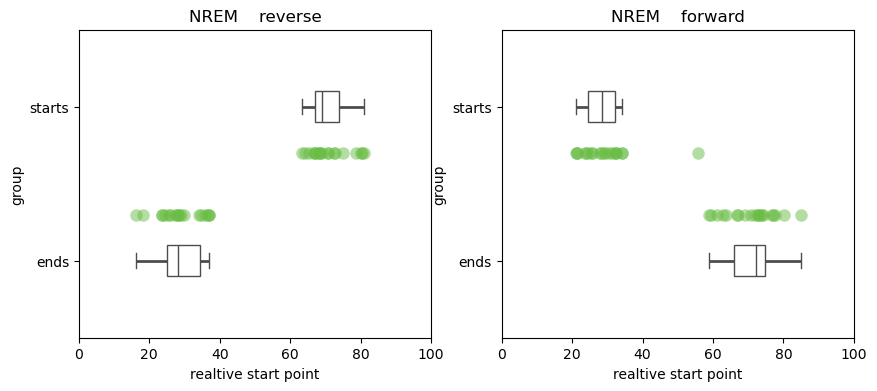

c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


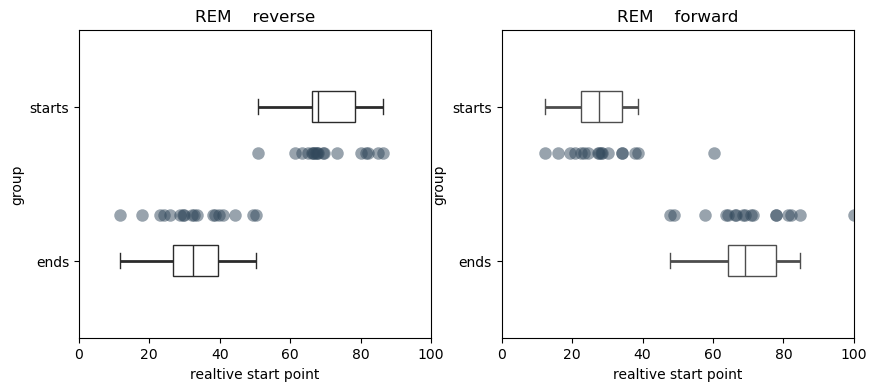

c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


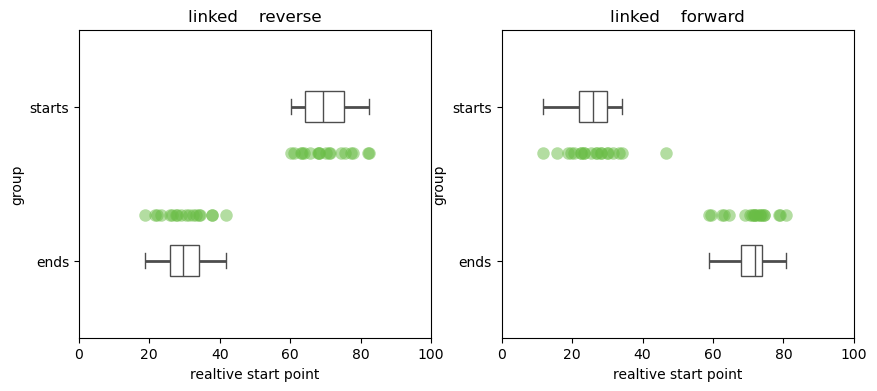

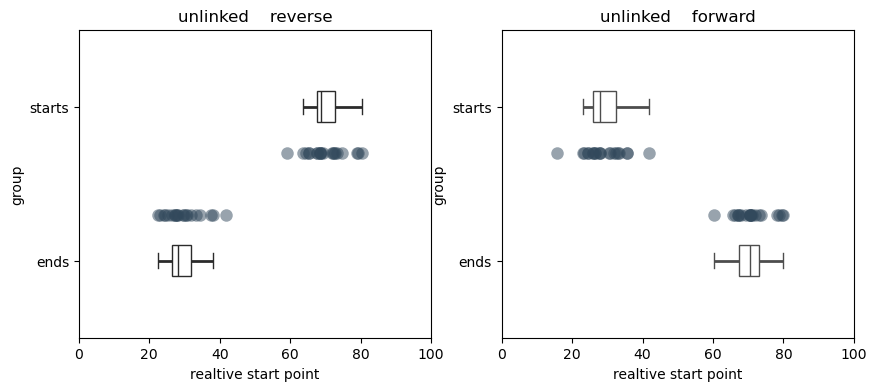

In [64]:

fig,[ax,ax2] = plt.subplots(1, 2,figsize=(10, 4)) 
all_chunk_reverse_start_mean, all_chunk_forward_start_mean, all_chunk_reverse_end_mean, all_chunk_forward_end_mean = extract_start_end_points(pd.DataFrame(rem_nrem_master['NREM']['start_end']))
plot_start_end_times(all_chunk_reverse_start_mean,all_chunk_forward_start_mean,all_chunk_reverse_end_mean,all_chunk_forward_end_mean,ax,ax2,'NREM','#69BD45')
SaveFig('nrem_start_ends.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

fig,[ax,ax2] = plt.subplots(1, 2,figsize=(10, 4))
all_chunk_reverse_start_mean, all_chunk_forward_start_mean, all_chunk_reverse_end_mean, all_chunk_forward_end_mean = extract_start_end_points(pd.DataFrame(rem_nrem_master['REM']['start_end']))
plot_start_end_times(all_chunk_reverse_start_mean,all_chunk_forward_start_mean,all_chunk_reverse_end_mean,all_chunk_forward_end_mean,ax,ax2,'REM','#32495C')
SaveFig('rem_start_ends.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

fig,[ax,ax2] = plt.subplots(1, 2,figsize=(10, 4))
all_chunk_reverse_start_mean, all_chunk_forward_start_mean, all_chunk_reverse_end_mean, all_chunk_forward_end_mean = extract_start_end_points(pd.DataFrame(linked_unlinked_master['linked']['start_end']))
plot_start_end_times(all_chunk_reverse_start_mean,all_chunk_forward_start_mean,all_chunk_reverse_end_mean,all_chunk_forward_end_mean,ax,ax2,'linked','#69BD45')
SaveFig('linked_start_ends.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

fig,[ax,ax2] = plt.subplots(1, 2,figsize=(10, 4))
all_chunk_reverse_start_mean, all_chunk_forward_start_mean, all_chunk_reverse_end_mean, all_chunk_forward_end_mean = extract_start_end_points(pd.DataFrame(linked_unlinked_master['unlinked']['start_end']))
plot_start_end_times(all_chunk_reverse_start_mean,all_chunk_forward_start_mean,all_chunk_reverse_end_mean,all_chunk_forward_end_mean,ax,ax2,'unlinked','#32495C')
SaveFig('unlinked_start_ends.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')



In [124]:

nrem_all_chunk_reverse_start_mean, nrem_all_chunk_forward_start_mean, nrem_all_chunk_reverse_end_mean, nrem_all_chunk_forward_end_mean = extract_start_end_points(pd.DataFrame(rem_nrem_master['NREM']['start_end']))
rem_all_chunk_reverse_start_mean, rem_all_chunk_forward_start_mean, rem_all_chunk_reverse_end_mean, rem_all_chunk_forward_end_mean = extract_start_end_points(pd.DataFrame(rem_nrem_master['REM']['start_end']))
linked_all_chunk_reverse_start_mean, linked_all_chunk_forward_start_mean, linked_all_chunk_reverse_end_mean, linked_all_chunk_forward_end_mean = extract_start_end_points(pd.DataFrame(linked_unlinked_master['linked']['start_end']))
unlinked_all_chunk_reverse_start_mean, unlinked_all_chunk_forward_start_mean, unlinked_all_chunk_reverse_end_mean, unlinked_all_chunk_forward_end_mean = extract_start_end_points(pd.DataFrame(linked_unlinked_master['unlinked']['start_end']))

group1 = [x for x in nrem_all_chunk_reverse_start_mean if not np.isnan(x)] 
group2 = [x for x in nrem_all_chunk_forward_start_mean if not np.isnan(x)] 
group3 = [x for x in nrem_all_chunk_reverse_end_mean if not np.isnan(x)] 
group4 = [x for x in nrem_all_chunk_forward_end_mean if not np.isnan(x)] 
group5 = [x for x in rem_all_chunk_reverse_start_mean if not np.isnan(x)] 
group6 = [x for x in rem_all_chunk_forward_start_mean if not np.isnan(x)] 
group7 = [x for x in rem_all_chunk_reverse_end_mean if not np.isnan(x)] 
group8 = [x for x in rem_all_chunk_forward_end_mean if not np.isnan(x)] 
group9 = [x for x in linked_all_chunk_reverse_start_mean if not np.isnan(x)] 
group10 = [x for x in linked_all_chunk_forward_start_mean if not np.isnan(x)] 
group11 = [x for x in linked_all_chunk_reverse_end_mean if not np.isnan(x)] 
group12 = [x for x in linked_all_chunk_forward_end_mean if not np.isnan(x)] 
group13 = [x for x in unlinked_all_chunk_reverse_start_mean if not np.isnan(x)] 
group14 = [x for x in unlinked_all_chunk_forward_start_mean if not np.isnan(x)] 
group15 = [x for x in unlinked_all_chunk_reverse_end_mean if not np.isnan(x)] 
group16 = [x for x in unlinked_all_chunk_forward_end_mean if not np.isnan(x)] 

for group in [group1, group2, group3, group4, group5, group6, group7, group8, group9, group10, group11, group12, group13, group14, group15, group16]:
    print(scipy.stats.shapiro(group))
    
df_nrem = pd.DataFrame({
    'group':       ['late'] * len(nrem_all_chunk_forward_start_mean),
    'forward_start': nrem_all_chunk_forward_start_mean,
    'forward_end':   nrem_all_chunk_forward_end_mean,
    'reverse_start': nrem_all_chunk_reverse_start_mean,
    'reverse_end':   nrem_all_chunk_reverse_end_mean,
})

df_rem = pd.DataFrame({
    'group':       ['early'] * len(rem_all_chunk_forward_start_mean),
    'forward_start': rem_all_chunk_forward_start_mean,
    'forward_end':   rem_all_chunk_forward_end_mean,
    'reverse_start': rem_all_chunk_reverse_start_mean,
    'reverse_end':   rem_all_chunk_reverse_end_mean,
})

df_linked = pd.DataFrame({
    'group':       ['linked'] * len(linked_all_chunk_forward_start_mean),
    'forward_start': linked_all_chunk_forward_start_mean,
    'forward_end':   linked_all_chunk_forward_end_mean,
    'reverse_start': linked_all_chunk_reverse_start_mean,
    'reverse_end':   linked_all_chunk_reverse_end_mean,
})

df_unlinked = pd.DataFrame({
    'group':       ['unlinked'] * len(unlinked_all_chunk_forward_start_mean),
    'forward_start': unlinked_all_chunk_forward_start_mean,
    'forward_end':   unlinked_all_chunk_forward_end_mean,
    'reverse_start': unlinked_all_chunk_reverse_start_mean,
    'reverse_end':   unlinked_all_chunk_reverse_end_mean,
})

print('_____________________________________________________________________________________________')
## permanova for rem nrem i think
from scipy.spatial.distance import pdist, squareform
from skbio.stats.distance import DistanceMatrix
from skbio.stats.distance import permanova

# 1. Concatenate and clean
df = pd.concat([df_nrem, df_rem], ignore_index=True)
df_clean = df.dropna(subset=['forward_start','forward_end','reverse_start','reverse_end']).reset_index(drop=True)

# 2. Build your feature matrix
X = df_clean[['forward_start','forward_end','reverse_start','reverse_end']].values

# 3. Compute Euclidean distances
dist_array = squareform(pdist(X, metric='euclidean'))

# 4. Create DistanceMatrix with simple integer-string IDs (0,1,2,…)
ids = [str(i) for i in range(len(df_clean))]
dm = DistanceMatrix(dist_array, ids=ids)

# 5. Extract grouping as a plain list (length N)
grouping = df_clean['group'].tolist()

# 6. Run PERMANOVA
result = permanova(distance_matrix=dm,
                   grouping=grouping,
                   permutations=999)

print(result)

#Compute R² manually (effect size)
# ss_total = sum of squared distances / n
D = dm.data        # <-- this is the fix
n = len(grouping)
ss_total = np.sum(D**2) / n

# ss_between: sum of squared group means
group_labels = np.array(grouping)
unique_groups = np.unique(group_labels)
ss_between = 0
for g in unique_groups:
    idx = np.where(group_labels == g)[0]
    Di = D[np.ix_(idx, idx)]
    ss_between += len(idx) * (Di.mean() ** 2)

r2 = ss_between / ss_total
print(f"PERMANOVA effect size R²: {r2:.5f}")

print('_____________________________________________________________________________________________')
from statsmodels.multivariate.manova import MANOVA
# Concatenate them:
df = pd.concat([df_linked, df_unlinked], ignore_index=True)
#  MANOVA
manova = MANOVA.from_formula('forward_start + forward_end +reverse_start +reverse_end  ~ group', data=df)
print(manova.mv_test())

# Compute partial eta-squared
eta_squared = compute_partial_eta_squared(manova.mv_test())
print("Partial eta-squared for each effect:", eta_squared)


c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\miniconda\envs\analysis_main\lib\site-packages\numpy\_core\_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide

ShapiroResult(statistic=np.float64(0.9061204963700601), pvalue=np.float64(0.06285938732751824))
ShapiroResult(statistic=np.float64(0.7736133615165437), pvalue=np.float64(0.0003582852080769677))
ShapiroResult(statistic=np.float64(0.9404969955492942), pvalue=np.float64(0.2691817853001265))
ShapiroResult(statistic=np.float64(0.9707792654946212), pvalue=np.float64(0.7712439799067917))
ShapiroResult(statistic=np.float64(0.9231248273603834), pvalue=np.float64(0.14683922611035938))
ShapiroResult(statistic=np.float64(0.9009760664365007), pvalue=np.float64(0.07052671673829441))
ShapiroResult(statistic=np.float64(0.9834605233155895), pvalue=np.float64(0.9785789173811841))
ShapiroResult(statistic=np.float64(0.9683742245572373), pvalue=np.float64(0.7893636282368055))
ShapiroResult(statistic=np.float64(0.9515132885266412), pvalue=np.float64(0.44924853226694567))
ShapiroResult(statistic=np.float64(0.9594748787520659), pvalue=np.float64(0.5334123915271906))
ShapiroResult(statistic=np.float64(0.985681

# coactive frequency 

In [70]:
# plot frequency of coactive events (1,2,3,4,etc.)

def plot_coactive_single(nrem_coactive_freqs_chunk, color_,var_string):   
    fig, ax= plt.subplots(1, 1,figsize=(3, 5))
    means = []
    stds = []
    x_ = []
    for item in nrem_coactive_freqs_chunk:
        ax.plot(np.ones(len(nrem_coactive_freqs_chunk[1]))*(1),nrem_coactive_freqs_chunk[1],'o', c = color_, alpha = 0.5, markeredgewidth = 0, markersize = 9)
        x_ += [item]
        means += [np.median(nrem_coactive_freqs_chunk[1])]
        stds += [np.std(nrem_coactive_freqs_chunk[1])]
        break 
    means = np.array(means)[np.argsort(x_)]
    stds = np.array(stds)[np.argsort(x_)]
    x_ = np.array(x_)[np.argsort(x_)]
    ax.plot(1.2,means[0],'<', color = color_,alpha = 0.7, markeredgewidth = 0, markersize = 9)
    ax.set_xlim(0,2)
    ax.set_ylabel('frequency')
    ax.set_title(var_string + ' coactive frequency')
    ax.set_ylim(0,1)


def plot_coactive_two_plus(nrem_coactive_freqs_chunk, color_,var_string): 
    max_keys = 6
    nrem_coactive_freqs_chunk = collapse_above_keys(nrem_coactive_freqs_chunk,max_keys)   

    fig, ax= plt.subplots(1, 1,figsize=(7, 5))
    means = []
    stds = []
    x_ = []
    for item in nrem_coactive_freqs_chunk:
        if not item == 1:
            ax.plot(np.ones(len(nrem_coactive_freqs_chunk[item]))*(item-0.1),nrem_coactive_freqs_chunk[item],'o', c = color_, alpha = 0.5, markeredgewidth = 0, markersize = 9)
            x_ += [item]
            means += [np.mean(nrem_coactive_freqs_chunk[item])]
            stds += [np.std(nrem_coactive_freqs_chunk[item])]
    means = np.array(means)[np.argsort(x_)]
    stds = np.array(stds)[np.argsort(x_)]
    x_ = np.array(x_)[np.argsort(x_)]

    ax.plot(x_,means,'<', color = color_,alpha = 0.7, markeredgewidth = 0, markersize = 8)
    ax.set_title(var_string + ' coactive frequency')
    ax.set_xlabel('number of coactive events')
    # SET THE X MARKERS 
    ax.set_xticks(np.arange(0, max_keys+2, 1))
    ax.set_xticklabels(['_','_','2','3','4','5','6+','_'])
    ax.set_ylim(0,0.4)
    
# get a reference to the original dict
def collapse_above_keys(freqs,max_key):

    # prepare a new dict and a placeholder for the merged value
    new_freqs = {}
    merged = []

    for k, v in freqs.items():
        if k < max_key:
            # keep all keys < max_key unchanged
            new_freqs[k] = v
        else:
            # collect everything with key >= max_key
            merged.append(v)

    # now combine the collected values into one entry "6+"
    # — if your values are numbers, you can sum them:
    if not len(merged) == 0:
        try:
            new_freqs[6] = sum(merged)
        except TypeError:
            # otherwise assume they’re sequences (lists, arrays…) and flatten:
            import itertools
            new_freqs[6] = list(itertools.chain.from_iterable(merged))

    # replace in your master dict
    return new_freqs


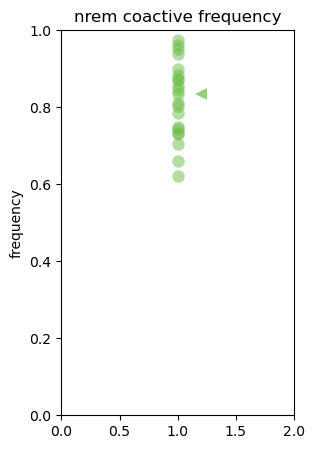

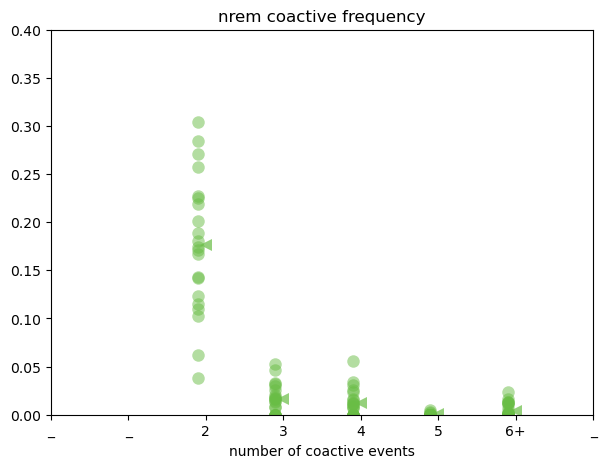

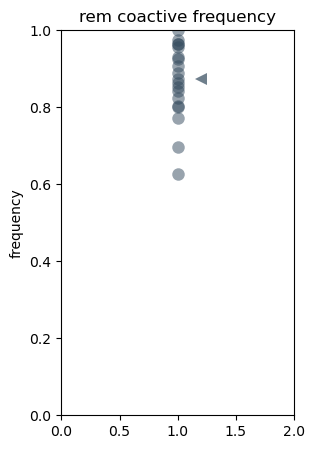

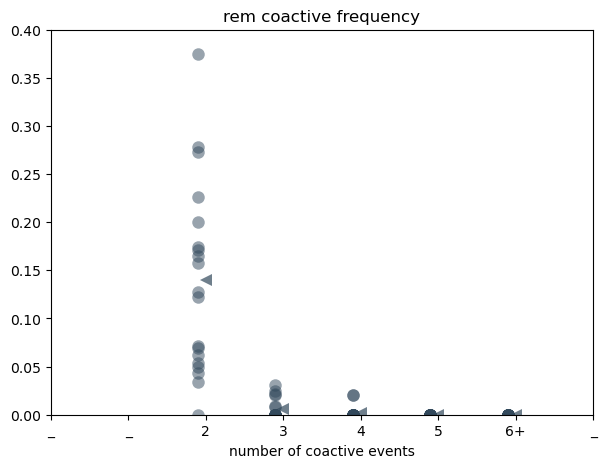

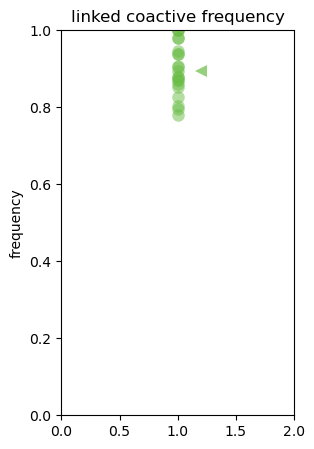

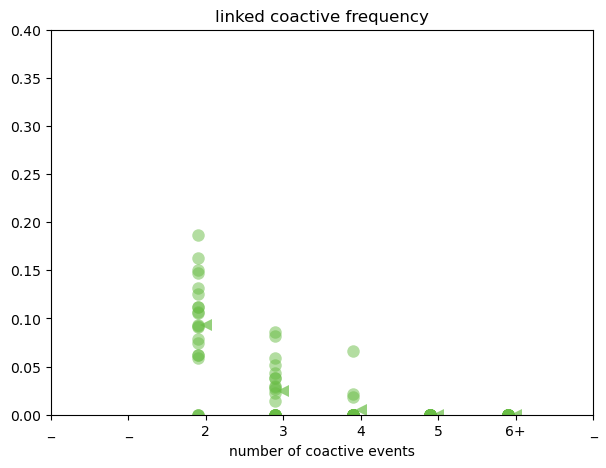

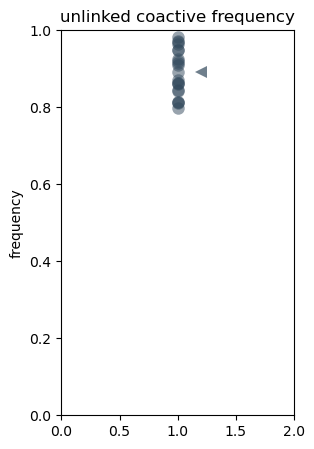

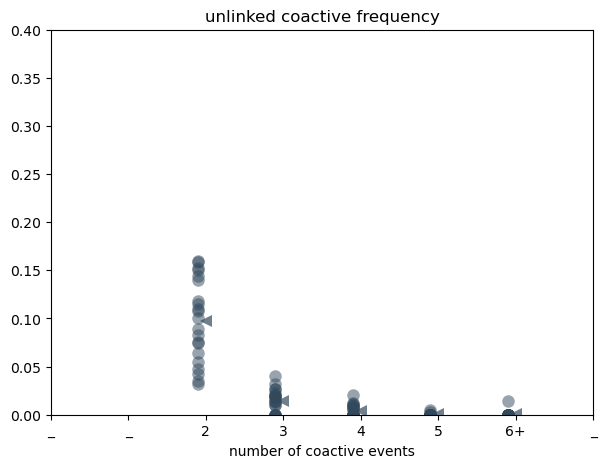

In [74]:


plot_coactive_single(rem_nrem_master['NREM']['coactive_freqs'], '#69BD45','nrem')
SaveFig('nrem_coactive_single.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')
plot_coactive_two_plus(rem_nrem_master['NREM']['coactive_freqs'], '#69BD45','nrem')
SaveFig('nrem_coactive.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

plot_coactive_single(rem_nrem_master['REM']['coactive_freqs'], '#32495C','rem')
SaveFig('rem_coactive_single.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')
plot_coactive_two_plus(rem_nrem_master['REM']['coactive_freqs'], '#32495C','rem')
SaveFig('rem_coactive.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

plot_coactive_single(linked_unlinked_master['linked']['coactive_freqs'], '#69BD45','linked')
SaveFig('linked_coactive_single.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')
plot_coactive_two_plus(linked_unlinked_master['linked']['coactive_freqs'], '#69BD45','linked')
SaveFig('linked_coactive.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

plot_coactive_single(linked_unlinked_master['unlinked']['coactive_freqs'], '#32495C','unlinked')
SaveFig('unlinked_coactive_single.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')
plot_coactive_two_plus(linked_unlinked_master['unlinked']['coactive_freqs'], '#32495C','unlinked')
SaveFig('unlinked_coactive.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')




stats


In [75]:
from skbio.stats.distance import permanova, DistanceMatrix
from skbio import DistanceMatrix
from scipy.spatial.distance import pdist, squareform
from skbio.stats.distance import DistanceMatrix
from skbio.stats.distance import permanova

def permanova_coactive_freqs(dat1, dat2):
    df = pd.DataFrame()
    df['groups'] = ['control']*len(dat1[1])  + ['lesion']*len(dat2[1])

    for key in [1,2,3,4,5,6]:
        if key not in dat1:
            dat1[key] = [0]
        if key not in dat2:
            dat2[key] = [0]
        current_var = dat1[key]
        while len(current_var)<len(dat1[1]):
            current_var +=[0]
        
        try:
            dat2[key]
            current_var_l = dat2[key]
            while len(current_var_l)<len(dat2[1]):
                current_var_l +=[0]
        except:
            current_var_l = [0]*len(dat2[1])
            
            
        df[str(key)] = current_var + current_var_l
        

    # Calculate the Euclidean distance matrix
    values = df[['1', '2', '3', '4', '5', '6']].values
    grouping = df['groups'].values

    pairwise_distances = pdist(values, metric='euclidean')
    distance_matrix = squareform(pairwise_distances)
    dm = DistanceMatrix(distance_matrix)

    # Perform PERMANOVA
    results = permanova(dm, grouping, permutations=10000)
    print(results)
    
    #Compute R² manually (effect size)
    # ss_total = sum of squared distances / n
    D = dm.data        # <-- this is the fix
    n = len(grouping)
    ss_total = np.sum(D**2) / n

    # ss_between: sum of squared group means
    group_labels = np.array(grouping)
    unique_groups = np.unique(group_labels)
    ss_between = 0
    for g in unique_groups:
        idx = np.where(group_labels == g)[0]
        Di = D[np.ix_(idx, idx)]
        ss_between += len(idx) * (Di.mean() ** 2)

    r2 = ss_between / ss_total
    print(f"PERMANOVA effect size R²: {r2:.5f}")



permanova_coactive_freqs(rem_nrem_master['NREM']['coactive_freqs'], rem_nrem_master['REM']['coactive_freqs'])
print('__________________')
permanova_coactive_freqs(linked_unlinked_master['linked']['coactive_freqs'], linked_unlinked_master['unlinked']['coactive_freqs'])

method name               PERMANOVA
test statistic name        pseudo-F
sample size                      40
number of groups                  2
test statistic             2.134484
p-value                    0.134687
number of permutations        10000
Name: PERMANOVA results, dtype: object
PERMANOVA effect size R²: 0.66341
__________________
method name               PERMANOVA
test statistic name        pseudo-F
sample size                      42
number of groups                  2
test statistic             0.310302
p-value                    0.626637
number of permutations        10000
Name: PERMANOVA results, dtype: object
PERMANOVA effect size R²: 0.70497


# ordered v disordered 

In [131]:

rem_nrem_master['NREM']
rem_nrem_master['REM']
linked_unlinked_master['linked']
linked_unlinked_master['unlinked']

list(rem_nrem_master['NREM'])

['animals',
 'reactivations_per_min',
 'event_lens',
 'regression',
 'binned_rate',
 'bins_relative_so',
 'start_end',
 'coactive_freqs',
 'ordered_misordered',
 'task_nontask',
 'sleep_seqbyseq_neuron_involvements']

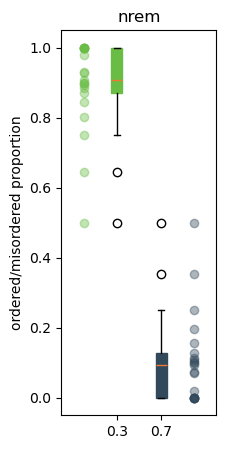

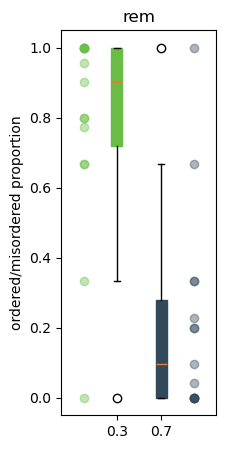

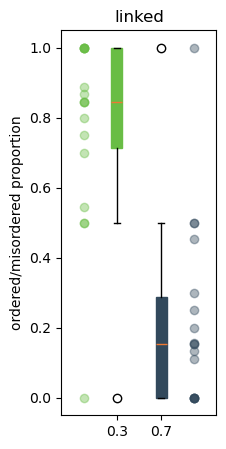

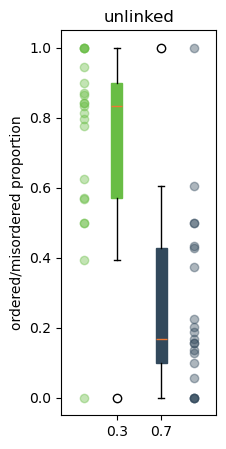

In [132]:

def plot_ordered_misrodered(nrem_ordered_misordered,var_string,var_string2):

    ordered = [item[0] for item in nrem_ordered_misordered]
    misordered = [item[1] for item in nrem_ordered_misordered]

    fig, ax = plt.subplots(figsize=(2, 5))

    ax.plot(np.zeros(len(ordered)), ordered, 'o', color = '#69BD45',alpha = 0.4)
    ax.boxplot([x for x in ordered if not np.isnan(x)], positions=[0.3], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#69BD45', color='#69BD45'), medianprops=dict(color='#EE7832'))
    ax.plot(np.ones(len(misordered)), misordered, 'o', color = '#32495C',alpha = 0.4)
    ax.boxplot([x for x in misordered if not np.isnan(x)], positions=[0.7], widths=0.1, patch_artist=True, boxprops=dict(facecolor='#32495C', color='#32495C'), medianprops=dict(color='#EE7832'))

    ax.set_ylabel(var_string2)
    
    ax.set_title(var_string)
    

plot_ordered_misrodered(rem_nrem_master['NREM']['ordered_misordered'],'nrem','ordered/misordered proportion')
SaveFig('nrem_ordered_disordered.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')
plot_ordered_misrodered(rem_nrem_master['REM']['ordered_misordered'],'rem','ordered/misordered proportion')
SaveFig('rem_ordered_disordered.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')
plot_ordered_misrodered(linked_unlinked_master['linked']['ordered_misordered'],'linked','ordered/misordered proportion')
SaveFig('linked_ordered_disordered.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')
plot_ordered_misrodered(linked_unlinked_master['unlinked']['ordered_misordered'],'unlinked','ordered/misordered proportion')
SaveFig('unlinked_ordered_disordered.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')


stats - ordered vs disovered

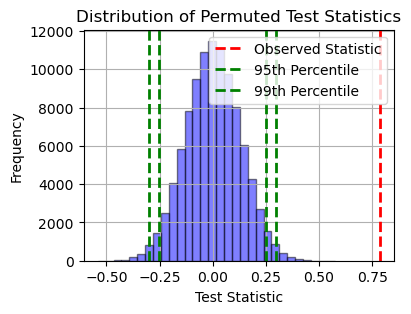

- p-value: 0.0
- 99th percentile of permuted statistics: 0.2976720452110017
- Observed Test Statistic: 0.7842682091297234
cohens d = 6.03343687418382
------------------


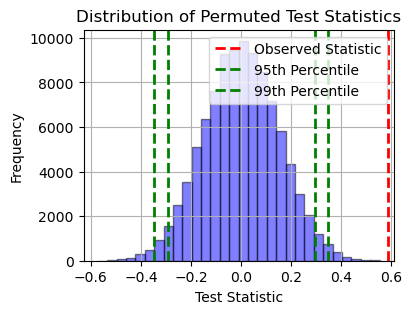

- p-value: 0.0
- 99th percentile of permuted statistics: 0.3474747474747473
- Observed Test Statistic: 0.5864472937219491
cohens d = 2.03002194044727
------------------


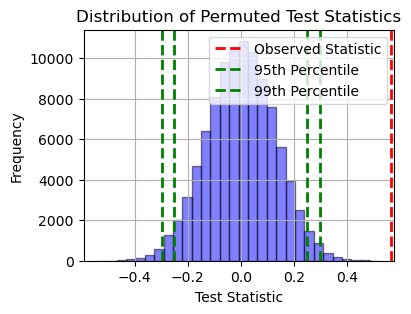

- p-value: 0.0
- 99th percentile of permuted statistics: 0.2970687915479581
- Observed Test Statistic: 0.5652297548130881
cohens d = 2.172851838827517
------------------


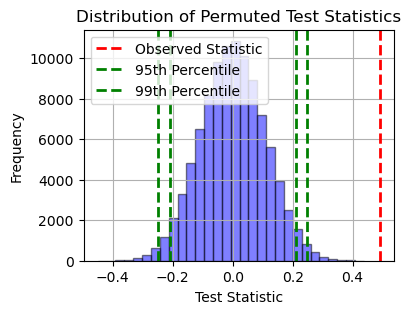

- p-value: 0.0
- 99th percentile of permuted statistics: 0.24837197440983755
- Observed Test Statistic: 0.48967904508739696
cohens d = 1.9489958456104068


In [133]:

def cohens_d(x, y):
    """
    Compute Cohen's d for two independent samples.
    """
    x = np.array(x)
    y = np.array(y)
    nx = len(x)
    ny = len(y)
    # Pooled standard deviation
    pooled_std = np.sqrt(((nx-1)*x.std(ddof=1)**2 + (ny-1)*y.std(ddof=1)**2) / (nx + ny - 2))
    d = (x.mean() - y.mean()) / pooled_std
    return d

def permutation_test(list1, list2):
    # Define your test statistic function
    def test_statistic(list1, list2):
        return np.mean(list1) - np.mean(list2)

    # Compute the observed test statistic
    observed_statistic = test_statistic(list1, list2)

    # Combine the two lists
    combined_data = list1 + list2

    # Number of permutations
    num_permutations = 100000

    # Initialize an array to store the permuted test statistics
    permuted_statistics = np.zeros(num_permutations)

    # Permutation test
    for i in range(num_permutations):
        # Shuffle the combined data
        np.random.shuffle(combined_data)
        
        # Split the shuffled data back into two lists
        permuted_list1 = combined_data[:len(list1)]
        permuted_list2 = combined_data[len(list1):]
        
        # Compute the test statistic for the permuted data
        permuted_statistics[i] = test_statistic(permuted_list1, permuted_list2)

    # Calculate the p-value
    p_value = np.mean(permuted_statistics >= observed_statistic)


    plt.figure(figsize=(4, 3))
    plt.hist(permuted_statistics, bins=30, alpha=0.5, color='blue', edgecolor='black')
    plt.axvline(observed_statistic, color='red', linestyle='dashed', linewidth=2, label='Observed Statistic')
    plt.xlabel('Test Statistic')
    plt.ylabel('Frequency')
    plt.title('Distribution of Permuted Test Statistics')
    plt.axvline(np.percentile(permuted_statistics, 97.5), color='green', linestyle='dashed', linewidth=2, label='95th Percentile')
    plt.axvline(np.percentile(permuted_statistics, 2.5), color='green', linestyle='dashed', linewidth=2)
    plt.axvline(np.percentile(permuted_statistics, 99), color='green', linestyle='dashed', linewidth=2, label='99th Percentile')
    plt.axvline(np.percentile(permuted_statistics, 1), color='green', linestyle='dashed', linewidth=2)
    plt.xlabel('Test Statistic')
    plt.legend()
    plt.grid(True)
    plt.show()
    

    print("- p-value:", p_value)
    print('- 99th percentile of permuted statistics:',np.percentile(permuted_statistics, 99))
    print("- Observed Test Statistic:", observed_statistic)

    
list1 = [float(item[0]) for item in rem_nrem_master['NREM']['ordered_misordered']] 
list2 = [float(item[1]) for item in rem_nrem_master['NREM']['ordered_misordered']] 
list1= [x for x in list1 if not np.isnan(x)] 
list2= [x for x in list2 if not np.isnan(x)] 
permutation_test(list1, list2)
print(f'cohens d = {cohens_d(list1, list2)}')

print('------------------')
list3 = [float(item[0]) for item in rem_nrem_master['REM']['ordered_misordered']] 
list4 = [float(item[1]) for item in rem_nrem_master['REM']['ordered_misordered']] 
list3= [x for x in list3 if not np.isnan(x)] 
list4= [x for x in list4 if not np.isnan(x)] 
permutation_test(list3, list4)
print(f'cohens d = {cohens_d(list3, list4)}')

print('------------------')
list5 = [float(item[0]) for item in linked_unlinked_master['linked']['ordered_misordered']] 
list6 = [float(item[1]) for item in linked_unlinked_master['linked']['ordered_misordered']] 
list5= [x for x in list5 if not np.isnan(x)] 
list6= [x for x in list6 if not np.isnan(x)] 
permutation_test(list5, list6)
print(f'cohens d = {cohens_d(list5, list6)}')

print('------------------')
list7 = [float(item[0]) for item in linked_unlinked_master['unlinked']['ordered_misordered']] 
list8 = [float(item[1]) for item in linked_unlinked_master['unlinked']['ordered_misordered']] 
list7= [x for x in list7 if not np.isnan(x)] 
list8= [x for x in list8 if not np.isnan(x)] 
permutation_test(list7, list8)
print(f'cohens d = {cohens_d(list7, list8)}')

stats - between groups 

In [134]:
print(scipy.stats.shapiro(list1))
print(scipy.stats.shapiro(list2))
print(scipy.stats.shapiro(list3))
print(scipy.stats.shapiro(list4))
print('------------------')
print(scipy.stats.shapiro(list5))
print(scipy.stats.shapiro(list6))
print(scipy.stats.shapiro(list7))
print(scipy.stats.shapiro(list8))

# use non-parametric permanova since not all are normal


ShapiroResult(statistic=np.float64(0.7956761444104473), pvalue=np.float64(0.0005638607495966187))
ShapiroResult(statistic=np.float64(0.7956761444104473), pvalue=np.float64(0.0005638607495966178))
ShapiroResult(statistic=np.float64(0.7505181865112971), pvalue=np.float64(0.0009114577656755511))
ShapiroResult(statistic=np.float64(0.7505181865112969), pvalue=np.float64(0.000911457765675545))
------------------
ShapiroResult(statistic=np.float64(0.7961018650061767), pvalue=np.float64(0.0013387415165162467))
ShapiroResult(statistic=np.float64(0.7961018650061771), pvalue=np.float64(0.001338741516516265))
ShapiroResult(statistic=np.float64(0.8574311156195833), pvalue=np.float64(0.005719427566645145))
ShapiroResult(statistic=np.float64(0.8574311156195833), pvalue=np.float64(0.005719427566645151))


In [135]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
from skbio.stats.distance import DistanceMatrix, permanova

def permanova_ordered_misordered(nrem, rem):

    df = pd.DataFrame(nrem + rem, columns=['ordered','misordered'])
    df['group'] = ['nrem']*len(nrem) + ['rem']*len(rem)

    # drop any NaNs
    df = df.dropna()

    # compute distance matrix
    dm = DistanceMatrix(
        squareform(pdist(df[['ordered','misordered']].values, 'euclidean'))
    )

    # run PERMANOVA
    res = permanova(dm, grouping=df['group'].tolist(), permutations=999)
    print(res)
    
    #Compute R² manually (effect size)
    # ss_total = sum of squared distances / n
    D = dm.data        # <-- this is the fix
    n = len(df['group'].tolist())
    ss_total = np.sum(D**2) / n

    # ss_between: sum of squared group means
    group_labels = np.array(df['group'].tolist())
    unique_groups = np.unique(group_labels)
    ss_between = 0
    for g in unique_groups:
        idx = np.where(group_labels == g)[0]
        Di = D[np.ix_(idx, idx)]
        ss_between += len(idx) * (Di.mean() ** 2)

    r2 = ss_between / ss_total
    print(f"PERMANOVA effect size R²: {r2:.5f}")

permanova_ordered_misordered(rem_nrem_master['NREM']['ordered_misordered'], rem_nrem_master['REM']['ordered_misordered'])
print('---------------------------------------------------')
permanova_ordered_misordered(linked_unlinked_master['linked']['ordered_misordered'], linked_unlinked_master['unlinked']['ordered_misordered'])


method name               PERMANOVA
test statistic name        pseudo-F
sample size                      36
number of groups                  2
test statistic             1.932218
p-value                       0.159
number of permutations          999
Name: PERMANOVA results, dtype: object
PERMANOVA effect size R²: 0.45154
---------------------------------------------------
method name               PERMANOVA
test statistic name        pseudo-F
sample size                      39
number of groups                  2
test statistic             0.212086
p-value                       0.636
number of permutations          999
Name: PERMANOVA results, dtype: object
PERMANOVA effect size R²: 0.52063


# task related 

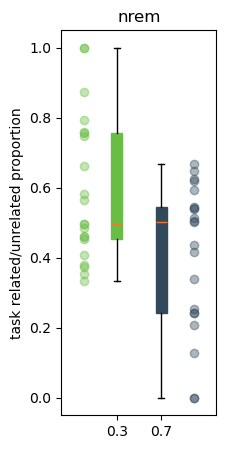

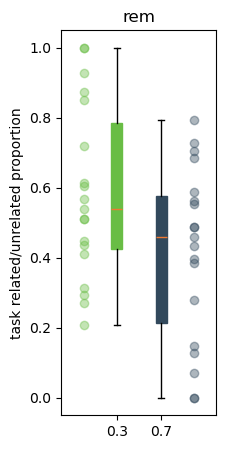

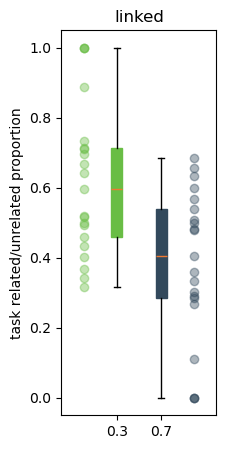

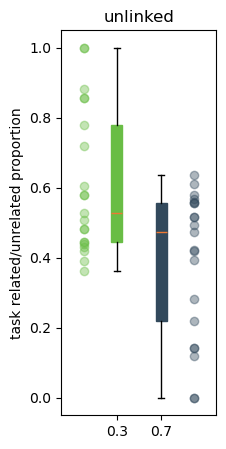

In [137]:
plot_ordered_misrodered(rem_nrem_master['NREM']['task_nontask'],'nrem','task related/unrelated proportion')
SaveFig('nrem_task_related.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')
plot_ordered_misrodered(rem_nrem_master['REM']['task_nontask'],'rem','task related/unrelated proportion')
SaveFig('rem_task_related.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')
plot_ordered_misrodered(linked_unlinked_master['linked']['task_nontask'],'linked','task related/unrelated proportion')
SaveFig('linked_task_related.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')
plot_ordered_misrodered(linked_unlinked_master['unlinked']['task_nontask'],'unlinked','task related/unrelated proportion')
SaveFig('unlinked_task_related.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')




stats

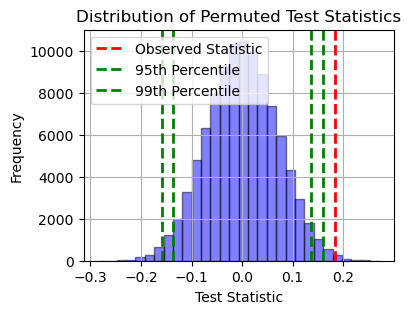

- p-value: 0.00336
- 99th percentile of permuted statistics: 0.160296220498089
- Observed Test Statistic: 0.184613305476039
cohens d = 0.8847335169009973
------------------


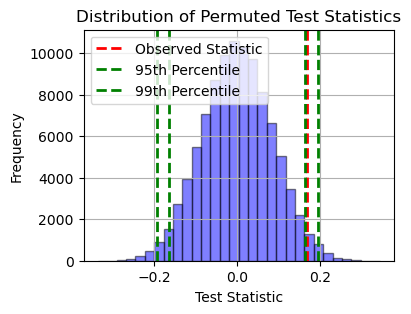

- p-value: 0.02236
- 99th percentile of permuted statistics: 0.1939656247730429
- Observed Test Statistic: 0.1688250597828131
cohens d = 0.6771195801135247
------------------


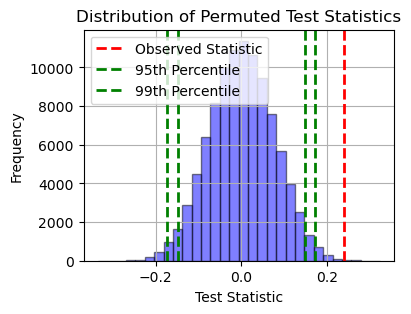

- p-value: 0.0004
- 99th percentile of permuted statistics: 0.17223610916135573
- Observed Test Statistic: 0.23805005866919526
cohens d = 1.0998429630313318
------------------


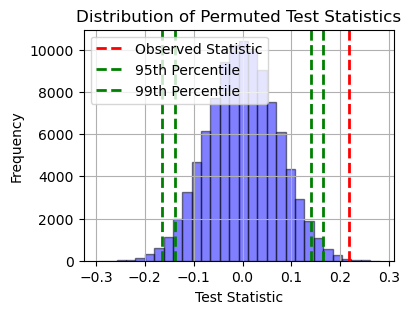

- p-value: 0.00066
- 99th percentile of permuted statistics: 0.1639530412021105
- Observed Test Statistic: 0.21823458799677237
cohens d = 1.0554868317060833


In [138]:
list1 = [float(item[0]) for item in rem_nrem_master['NREM']['task_nontask']] 
list2 = [float(item[1]) for item in rem_nrem_master['NREM']['task_nontask']] 
list1= [x for x in list1 if not np.isnan(x)] 
list2= [x for x in list2 if not np.isnan(x)] 
permutation_test(list1, list2)
print(f'cohens d = {cohens_d(list1, list2)}')

print('------------------')
list3 = [float(item[0]) for item in rem_nrem_master['REM']['task_nontask']] 
list4 = [float(item[1]) for item in rem_nrem_master['REM']['task_nontask']] 
list3= [x for x in list3 if not np.isnan(x)] 
list4= [x for x in list4 if not np.isnan(x)] 
permutation_test(list3, list4)
print(f'cohens d = {cohens_d(list3, list4)}')

print('------------------')
list5 = [float(item[0]) for item in linked_unlinked_master['linked']['task_nontask']] 
list6 = [float(item[1]) for item in linked_unlinked_master['linked']['task_nontask']] 
list5= [x for x in list5 if not np.isnan(x)] 
list6= [x for x in list6 if not np.isnan(x)] 
permutation_test(list5, list6)
print(f'cohens d = {cohens_d(list5, list6)}')

print('------------------')
list7 = [float(item[0]) for item in linked_unlinked_master['unlinked']['task_nontask']] 
list8 = [float(item[1]) for item in linked_unlinked_master['unlinked']['task_nontask']] 
list7= [x for x in list7 if not np.isnan(x)] 
list8= [x for x in list8 if not np.isnan(x)] 
permutation_test(list7, list8)
print(f'cohens d = {cohens_d(list7, list8)}')

stats between groups

In [139]:
print(scipy.stats.shapiro(list1))
print(scipy.stats.shapiro(list2))
print(scipy.stats.shapiro(list3))
print(scipy.stats.shapiro(list4))
print('------------------')
print(scipy.stats.shapiro(list5))
print(scipy.stats.shapiro(list6))
print(scipy.stats.shapiro(list7))
print(scipy.stats.shapiro(list8))


ShapiroResult(statistic=np.float64(0.9076221583547534), pvalue=np.float64(0.04929575675487022))
ShapiroResult(statistic=np.float64(0.9076221583547537), pvalue=np.float64(0.04929575675487088))
ShapiroResult(statistic=np.float64(0.9392161897217828), pvalue=np.float64(0.255247524036204))
ShapiroResult(statistic=np.float64(0.9392161897217826), pvalue=np.float64(0.25524752403620055))
------------------
ShapiroResult(statistic=np.float64(0.9250579322627114), pvalue=np.float64(0.10956490245265249))
ShapiroResult(statistic=np.float64(0.9250579322627114), pvalue=np.float64(0.10956490245265249))
ShapiroResult(statistic=np.float64(0.8764838155861518), pvalue=np.float64(0.012578470788631474))
ShapiroResult(statistic=np.float64(0.8764838155861518), pvalue=np.float64(0.012578470788631474))


In [140]:
#permanova for nrem vs rem
permanova_ordered_misordered(rem_nrem_master['NREM']['task_nontask'], rem_nrem_master['REM']['task_nontask'])
print('---------------------------------------------------')
permanova_ordered_misordered(linked_unlinked_master['linked']['task_nontask'], linked_unlinked_master['unlinked']['task_nontask'])

#manova for linked vs unlinked 

# # permanova_ordered_misordered(expert_master['task_nontask'], hlesion_master['task_nontask'])

# from statsmodels.multivariate.manova import MANOVA
# data = {
#     'group': ['control']*len(conactinate_nth_items(linked_unlinked_master['linked']['task_nontask'])[0])+['lesion']*len(conactinate_nth_items(linked_unlinked_master['unlinked']['task_nontask'])[0]),
#     'TASK': conactinate_nth_items(linked_unlinked_master['linked']['task_nontask'])[0]+conactinate_nth_items(linked_unlinked_master['unlinked']['task_nontask'])[0],
#     'NONTASK': conactinate_nth_items(linked_unlinked_master['linked']['task_nontask'])[1]+conactinate_nth_items(linked_unlinked_master['unlinked']['task_nontask'])[1],
# }
# df = pd.DataFrame(data)
# # Perform MANOVA
# manova = MANOVA.from_formula('TASK + NONTASK ~ group', data=df)
# print(manova.mv_test())


method name               PERMANOVA
test statistic name        pseudo-F
sample size                      40
number of groups                  2
test statistic             0.011871
p-value                       0.913
number of permutations          999
Name: PERMANOVA results, dtype: object
PERMANOVA effect size R²: 0.63278
---------------------------------------------------
method name               PERMANOVA
test statistic name        pseudo-F
sample size                      42
number of groups                  2
test statistic             0.023008
p-value                       0.886
number of permutations          999
Name: PERMANOVA results, dtype: object
PERMANOVA effect size R²: 0.61873


# neuron involvement rate

In [ ]:
import scipy
def return_binned_neuron_awake_sleep_rel(awake_dat,sleep_dat):
    awake_sleep_relationship = {}
    for index_, item, in enumerate(awake_dat):
        for index, awake_mouse_data in enumerate(item):

            awake = awake_mouse_data
            sleep = np.array(sleep_dat[index_][index])

            min_neurons_filter = 0
            bins = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]    

            for bin_ in bins:
                mask = np.round(awake,1) == bin_
                if len(sleep[mask]) > min_neurons_filter:
                    if bin_ in awake_sleep_relationship:
                        awake_sleep_relationship[bin_] += [np.mean(sleep[mask])]
                    else:
                        awake_sleep_relationship[bin_] = [np.mean(sleep[mask])]

    return awake_sleep_relationship




def plot_awake_sleep_relationship(awake_sleep_relationship,color_,ax):




    keys = []
    e_means = []
    sem = []
    for key in awake_sleep_relationship:
        if len(awake_sleep_relationship[key]) > 0:
            keys += [key]
    #         ax.plot([key]* len(e_awake_sleep_relationship[key]),e_awake_sleep_relationship[key],'o', color = 'red')

            a_s_relationship = [x for x in awake_sleep_relationship[key] if not np.isnan(x)]

            e_means += [np.mean(a_s_relationship)]
            sem += [scipy.stats.tstd(a_s_relationship)]
    ax.plot(sorted(keys),np.array(e_means)[np.argsort(keys)],'o--', c = color_, markersize = 10)

    upper = np.array(e_means)[np.argsort(keys)] + sem
    lower = np.array(e_means)[np.argsort(keys)] - sem
    ax.fill_between(sorted(keys),(lower),(upper),
        alpha=0.2, edgecolor='None', facecolor=color_,
        linewidth=1, linestyle='dashdot', antialiased=True)

    x = np.linspace(0, 1, 10)  # Example x values
    y = x  # Since x equals y, y values are the same as x values
    plt.plot(x,y,'--')


    ax.set_ylim(0,0.8)


    ax.set_ylabel('replay proportion involvement')
    ax.set_xlabel('awake proportion involvement')

    #################################################

    from scipy.optimize import curve_fit
    from scipy.stats import t

    # Extract the bins and corresponding values
    bins = list(awake_sleep_relationship.keys())
    
    bin_centers = np.array(bins)[np.argsort(bins)]
    values = np.array([np.nanmean(awake_sleep_relationship[bin]) for bin in bins])[np.argsort(bins)]

    # Define the exponential function
    def exponential_model(x, a, b):
        return a * np.exp(b * x)

    # Fit the model to the data
    popt, pcov = curve_fit(exponential_model, bin_centers, values)

    # Extract the fitting parameters
    a, b = popt

    # Calculate the fitted values
    fitted_values = exponential_model(bin_centers, *popt)

    # Calculate R-squared
    residuals = values - fitted_values
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((values - np.mean(values))**2)
    r_squared = 1 - (ss_res / ss_tot)

    # Degrees of freedom
    dof = max(0, len(bin_centers) - len(popt))

    # Calculate standard errors of the parameters
    perr = np.sqrt(np.diag(pcov))

    # Calculate t-values for the parameters
    t_values = popt / perr

    # Calculate p-values for the parameters
    p_values = [2 * (1 - t.cdf(np.abs(t_val), dof)) for t_val in t_values]

    print(f'Fitted parameters: a = {a}, b = {b}')
    print(f'R-squared: {r_squared}')
    print(f'p-values: {p_values}')


    # # Plot the original data and the fitted curve
    # plt.scatter(bin_centers, values, label='Data')
    # plt.plot(bin_centers, fitted_values, label='Fitted curve', color='red', alpha = 0.4)
    # plt.xlabel('Bin Center')
    # plt.ylabel('Value')




Fitted parameters: a = 0.0310738738682161, b = 3.2913379515073835
R-squared: 0.9952669716337372
p-values: [np.float64(4.125910028518476e-06), np.float64(2.026374845698342e-09)]
Fitted parameters: a = 0.03006876745933586, b = 3.3231598209114264
R-squared: 0.9934488507869669
p-values: [np.float64(1.527501191223024e-05), np.float64(7.44214889714101e-09)]


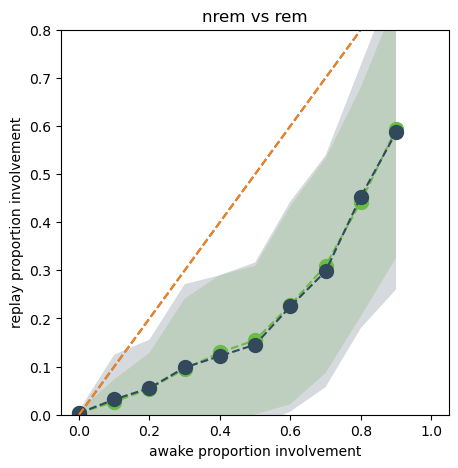

Fitted parameters: a = 0.03367378099734572, b = 3.201351083248676
R-squared: 0.9922724755147638
p-values: [np.float64(2.0593868998775022e-05), np.float64(1.4353792376908814e-08)]
Fitted parameters: a = 0.0328558221580791, b = 3.210093530299527
R-squared: 0.9931276627714299
p-values: [np.float64(1.3138176551796832e-05), np.float64(8.652554006616242e-09)]


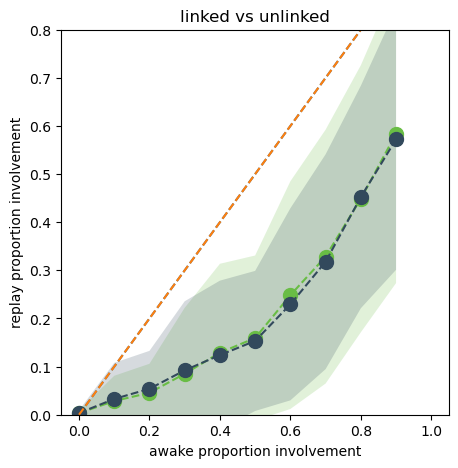

In [89]:
awake_seqbyseq_neuron_involvements = neuron_involvement_master['awake_seqbyseq_neuron_involvements']

fig, ax = plt.subplots(1, 1,figsize=(5, 5))
nrem_awake_sleep_relationship = return_binned_neuron_awake_sleep_rel(awake_seqbyseq_neuron_involvements,rem_nrem_master['NREM']['sleep_seqbyseq_neuron_involvements'])
plot_awake_sleep_relationship(nrem_awake_sleep_relationship,'#69BD45',ax)
rem_awake_sleep_relationship = return_binned_neuron_awake_sleep_rel(awake_seqbyseq_neuron_involvements,rem_nrem_master['REM']['sleep_seqbyseq_neuron_involvements'])
plot_awake_sleep_relationship(rem_awake_sleep_relationship,'#32495C',ax)
ax.set_title('nrem vs rem')
SaveFig('nrem_rem_neuron_involvements.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')

fig, ax = plt.subplots(1, 1,figsize=(5, 5))
linked_awake_sleep_relationship = return_binned_neuron_awake_sleep_rel(awake_seqbyseq_neuron_involvements,linked_unlinked_master['linked']['sleep_seqbyseq_neuron_involvements'])
plot_awake_sleep_relationship(linked_awake_sleep_relationship,'#69BD45',ax)
unlinked_awake_sleep_relationship = return_binned_neuron_awake_sleep_rel(awake_seqbyseq_neuron_involvements,linked_unlinked_master['unlinked']['sleep_seqbyseq_neuron_involvements'])
plot_awake_sleep_relationship(unlinked_awake_sleep_relationship,'#32495C',ax)
ax.set_title('linked vs unlinked')
SaveFig('linked_unlinked_neuron_involvements.pdf',r'C:\Users\Emmett Thompson\Documents\plots\\')


stats 

In [91]:
def manova_groups_neuron_involvement(data1,data2):

    nrem_means = []
    for key in data1:
        if len(data1[key]) > 0:
            nrem_means += [np.nanmean(data1[key])]
    rem_means = []       
    for key in data2:
        if len(data2[key]) > 0:
            rem_means += [np.nanmean(data2[key])]

    x = nrem_means
    y = sorted(data1)

    x2 = rem_means
    y2 = sorted(data2)

    import statsmodels.api as sm
    from statsmodels.multivariate.manova import MANOVA

    A = pd.DataFrame({'x': x,
                    'y': y,
                    'groups': ['A'] * len(x)})
    B = pd.DataFrame({'x': x2,
                    'y': y2,
                    'groups': ['B'] * len(x2)})
    # Combine the data into one DataFrame
    data = pd.concat([A, B], axis=0)


    # Perform MANOVA
    manova = MANOVA.from_formula('x + y ~ groups', data=data)

    # Print the MANOVA results
    print(manova.mv_test())
    
    return manova.mv_test()
    
m =manova_groups_neuron_involvement(nrem_awake_sleep_relationship,rem_awake_sleep_relationship)
eta_squared = compute_partial_eta_squared(m)
print("Partial eta-squared for each effect:", eta_squared)

print('_________________________________________________________________________________________')
m =manova_groups_neuron_involvement(linked_awake_sleep_relationship,unlinked_awake_sleep_relationship)
eta_squared = compute_partial_eta_squared(m)
print("Partial eta-squared for each effect:", eta_squared)



                 Multivariate linear model
                                                            
------------------------------------------------------------
       Intercept        Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.3573 2.0000 17.0000 15.2869 0.0002
         Pillai's trace 0.6427 2.0000 17.0000 15.2869 0.0002
 Hotelling-Lawley trace 1.7985 2.0000 17.0000 15.2869 0.0002
    Roy's greatest root 1.7985 2.0000 17.0000 15.2869 0.0002
------------------------------------------------------------
                                                            
------------------------------------------------------------
         groups         Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.9998 2.0000 17.0000  0.0019 0.9981
         Pillai's trace 0.0002 2.0000 17.0000  0.0019 0.9981
 Hotelling-Lawley trace 0.0002 2.0000 17.0